**Load data from my Google Drive shared folder. [Link](https://drive.google.com/drive/folders/1QPT7W-5dshhv-r6v52Qo7uyL_unwSTjX?usp=sharing)**


In [1]:
# Install prerequisites
%%capture
!pip install pypandoc
!apt-get install texlive texlive-xetex texlive-latex-extra pandoc

In [2]:
from google.colab import drive

drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [3]:
import math
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import calendar as cal

%matplotlib inline

In [4]:
# Read all data files
data_dir = "/content/drive/MyDrive/Ahmedabad University/Research Assistantship/"
dengue_data = pd.read_excel(f"{data_dir}/Ahmedabad Dengue Data - to Lalit.xlsx")
meteorological_cols = ["Datetime (IST)", "2m Air Temperature (C)", "Relative Humidity (%)"]
meteorological_data = pd.read_excel(
    f"{data_dir}/Ahmedabad Meteorological Data - to Lalit.xlsx", usecols=meteorological_cols
)
meteorological_imd_cols = ["Minimum temperature average (°C)", "Maximum temperature average (°C)"]
meteorological_data_imd = pd.read_excel(
    f"{data_dir}/TemperatureAndRainfallData.xlsx", sheet_name="Combined", usecols=meteorological_imd_cols
)
meteorological_data_lst_day = pd.read_excel(f"{data_dir}/Ahmedabad Meteorological Data LST Day - to Lalit.xlsx")
meteorological_data_lst_night = pd.read_excel(f"{data_dir}/Ahmedabad Meteorological Data LST Night - to Lalit.xlsx")

In [5]:
print(dengue_data)

    Year  2012  2013  2014  2015  2016  2017  2018  2019  2020  2021  2022
0    Jan    32    31    10    41    26    40    34    11    81    17    19
1    Feb    11    25     3    14    16    21    42    18    24    18     5
2    Mar    10    19    12    14    33    21    26     7    33    12     8
3    Apr    10    20    12    18    40    26    30     8    15     5     8
4    May     8    40    12    20    75    14    24    13    11     3    17
5   June    30    49     7    38    28    32    18    12    16    13    27
6   July   108   140    16   150   102    73    72   137    22   104    43
7    Aug   242   338    28   359   252   132   309   351     3   505   256
8    Sep   371   542    87   661   778   197   899  1409    50   973   969
9    Oct   744   215   253   596   990   289  1234  1439   104   886   620
10   Nov   368   105   425   191   395   169   332   828    52   419   385
11   Dec    84    51   315    63   117    65   115   314    21   149   104


In [6]:
months = dengue_data.iloc[:, 0]
meteorological_data_lst = meteorological_data_lst_day.copy()
meteorological_data_lst["Night Time Land Surface Temperature (C)"] = meteorological_data_lst_night[
    "Night Time Land Surface Temperature (C)"
]

In [7]:
# Set chart appearance
plt.rcParams["figure.figsize"] = (30, 15)
colors = ["#FF0000", "#00FF00", "#0000FF", "#00FFFF", "#FF00FF", "#03A9F4"]
palette = sns.set_palette(sns.color_palette(colors))
sns.set_theme(context="talk", palette=palette)
display_options1 = {"linewidth": 2, "markers": True, "dashes": False, "linestyle": "solid", "ms": 10}
display_options2 = {"linewidth": 2, "markers": True, "dashes": False, "linestyle": "dashed", "ms": 10}
display_options3 = {
    "linewidth": 4,
    "markers": True,
    "dashes": False,
    "palette": ["black"],
    "linestyle": "solid",
    "ms": 10,
}
display_options4 = {
    "linewidth": 2,
    "markers": True,
    "dashes": False,
    "palette": ["black"],
    "linestyle": "solid",
    "ms": 10,
}

In [8]:
monthly_stats = pd.DataFrame()
monthly_stats["Month"] = dengue_data["Year"]

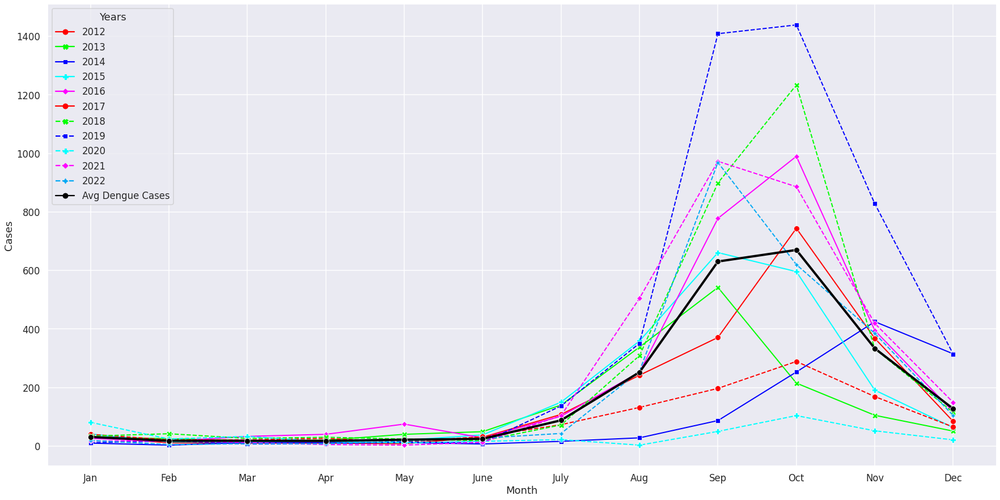

In [9]:
# Monthly Dengue Cases
monthly_stats["Avg Dengue Cases"] = dengue_data.iloc[:, 1:12].mean(axis=1)
monthly_stats["SD Dengue Cases"] = dengue_data.iloc[:, 1:12].std(axis=1)
sns.lineplot(data=dengue_data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=dengue_data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 1]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(xlabel="Month", ylabel="Cases")
plot.set_xticks(months.index), plot.set_xticklabels(months);

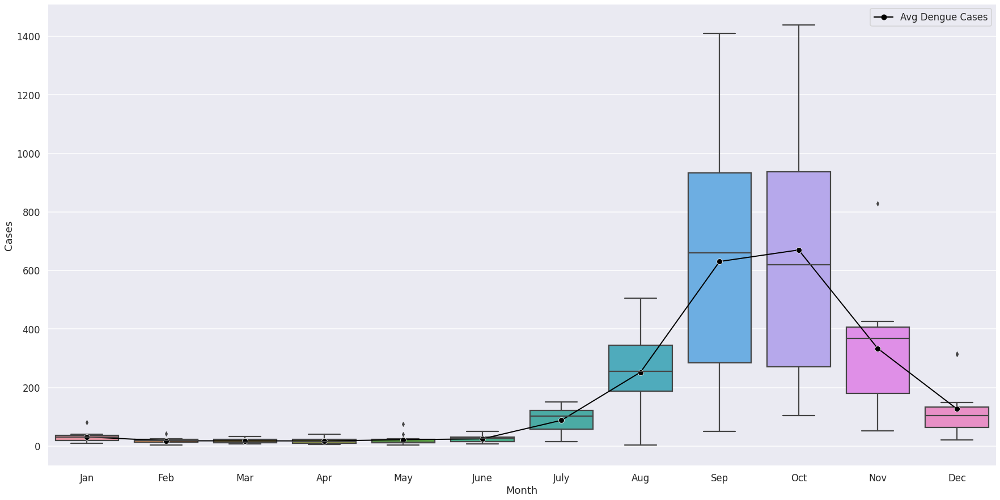

In [10]:
data = pd.DataFrame(columns=["Month", "Cases"])
for i in range(1, 12):
    data = pd.concat([data, pd.DataFrame({"Month": months, "Cases": dengue_data.iloc[:, i]})], ignore_index=True)
sns.boxplot(x="Month", y="Cases", data=data)
sns.lineplot(data=monthly_stats.iloc[:, [0, 1]], **display_options4);

In [11]:
dengue_data_log = dengue_data.copy()
for i in range(1, 12):
    dengue_data_log.iloc[:, i] = dengue_data_log.iloc[:, i].apply(math.log)

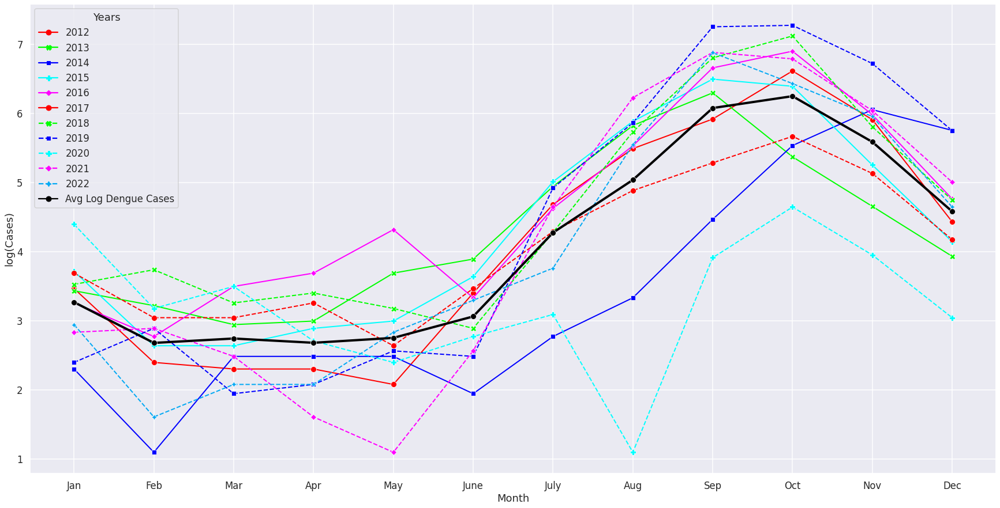

In [12]:
# log(Monthly Dengur Cases)
monthly_stats["Avg Log Dengue Cases"] = dengue_data_log.iloc[:, 1:12].mean(axis=1)
monthly_stats["SD Log Dengue Cases"] = dengue_data_log.iloc[:, 1:12].std(axis=1)
sns.lineplot(data=dengue_data_log.iloc[:, 0:6], **display_options1)
sns.lineplot(data=dengue_data_log.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 3]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(xlabel="Month", ylabel="log(Cases)")
plot.set_xticks(months.index), plot.set_xticklabels(months);

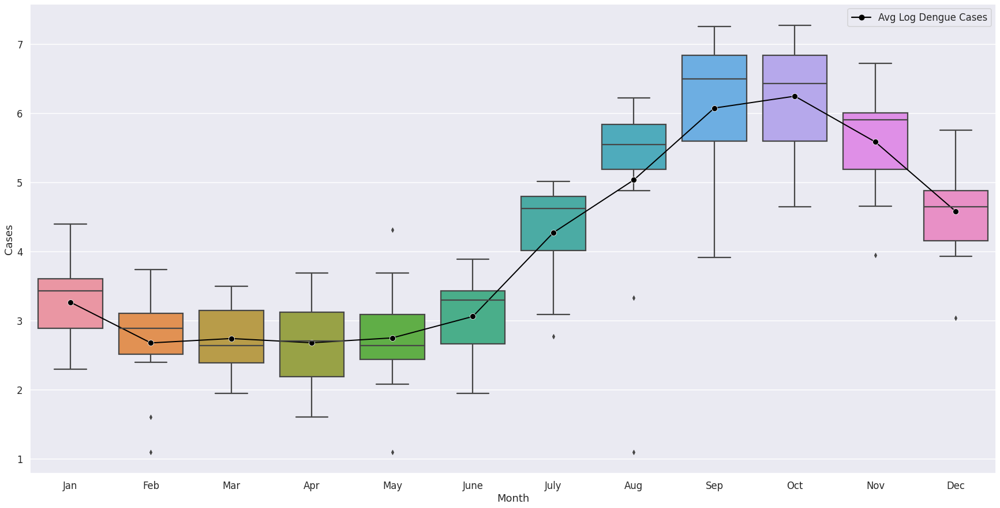

In [13]:
data = pd.DataFrame(columns=["Month", "Cases"])
for i in range(1, 12):
    data = pd.concat([data, pd.DataFrame({"Month": months, "Cases": dengue_data_log.iloc[:, i]})], ignore_index=True)
sns.boxplot(x="Month", y="Cases", data=data)
sns.lineplot(data=monthly_stats.iloc[:, [0, 3]], **display_options4);

**Since 2022 has incomplete data for December, the monthly averages will not include the year 2022.**


In [14]:
# Calculate daily values
daily_data = []
for i in range(0, 96409, 24):
    day_data = meteorological_data.iloc[i : i + 24]
    day_datapoints = [
        day_data.iloc[0]["Datetime (IST)"].date(),
        day_data["2m Air Temperature (C)"].min(),
        day_data["2m Air Temperature (C)"].max(),
        day_data["Relative Humidity (%)"].min(),
        day_data["Relative Humidity (%)"].max(),
    ]
    daily_data.append(day_datapoints)
daily_data = pd.DataFrame(
    daily_data,
    columns=[
        "Date",
        "Min Temp",
        "Max Temp",
        "Min RH",
        "Max RH",
    ],
)

# Calculate monthly values
monthly_data = []
for i in range(2012, 2023):
    for j in range(1, 13):
        month_data = daily_data[daily_data["Date"] >= dt.date(i, j, 1)][: cal.monthrange(i, j)[1]]
        month_data_mtr = meteorological_data[meteorological_data["Datetime (IST)"] >= dt.datetime(i, j, 1)][
            : 24 * cal.monthrange(i, j)[1]
        ]
        month_datapoints = [
            cal.month_name[j],
            month_data_mtr["2m Air Temperature (C)"].mean(),
            month_data["Min Temp"].mean(),
            month_data["Max Temp"].mean(),
            month_data["Max Temp"].mean() - month_data["Min Temp"].mean(),
            month_data_mtr["2m Air Temperature (C)"].std(),
            month_data["Min Temp"].std(),
            month_data["Max Temp"].std(),
            month_data_mtr["Relative Humidity (%)"].mean(),
            month_data["Min RH"].mean(),
            month_data["Max RH"].mean(),
            month_data["Max RH"].mean() - month_data["Min RH"].mean(),
            month_data_mtr["Relative Humidity (%)"].std(),
            month_data["Min RH"].std(),
            month_data["Max RH"].std(),
        ]
        monthly_data.append(month_datapoints)
monthly_data = pd.DataFrame(
    monthly_data,
    columns=[
        "Month",
        "Avg Temp",
        "Avg Min Temp",
        "Avg Max Temp",
        "Delta Temp",
        "SD Temp",
        "SD Min Temp",
        "SD Max Temp",
        "Avg RH",
        "Avg Min RH",
        "Avg Max RH",
        "Delta RH",
        "SD RH",
        "SD Min RH",
        "SD Max RH",
    ],
)

In [15]:
monthly_data.describe()

,Avg Temp,Avg Min Temp,Avg Max Temp,Delta Temp,SD Temp,SD Min Temp,SD Max Temp,Avg RH,Avg Min RH,Avg Max RH,Delta RH,SD RH,SD Min RH,SD Max RH
count,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000
mean,26.925530,21.751533,32.798074,11.046541,4.195452,1.557856,1.822192,56.669069,38.136352,74.845123,36.708771,14.902190,7.628583,9.215710
std,4.141354,4.705631,4.144424,3.526770,1.248675,0.673766,0.747284,15.839025,17.590013,11.952520,7.710088,2.779329,3.604482,4.118409
min,18.772500,12.763226,25.165806,4.123226,1.756203,0.405213,0.540570,32.290486,14.864000,51.374193,18.558064,8.460329,2.143679,1.870553
25%,23.546612,16.915024,29.898064,7.887167,3.323040,1.036444,1.263682,44.082089,24.712823,65.776024,32.094756,13.304258,5.064526,5.802869
50%,27.396445,23.208667,31.707188,12.346935,4.689347,1.570916,1.684787,53.431727,32.482360,73.684409,37.707333,15.301440,6.599130,9.297353
75%,30.223596,25.520726,35.944650,13.889032,5.141814,2.020873,2.278855,70.789442,52.843024,86.208748,41.995860,16.926369,9.677632,12.027744
max,34.249812,28.650333,41.372258,16.375161,6.383842,3.441759,4.687350,87.762208,75.885807,96.276333,55.110646,22.084049,20.072388,23.195126


In [16]:
# Calculate monthly values for LST data
monthly_data_lst = []
for i in range(2012, 2023):
    for j in range(1, 13):
        month_data_lst = meteorological_data_lst[meteorological_data_lst["Date"] >= dt.datetime(i, j, 1)][
            : cal.monthrange(i, j)[1]
        ]
        month_datapoints_lst = [
            cal.month_name[j],
            month_data_lst["Daytime Land Surface Temperature (C)"].mean(),
            month_data_lst["Night Time Land Surface Temperature (C)"].mean(),
            month_data_lst["Daytime Land Surface Temperature (C)"].mean()
            - month_data_lst["Night Time Land Surface Temperature (C)"].mean(),
            month_data_lst["Daytime Land Surface Temperature (C)"].std(),
            month_data_lst["Night Time Land Surface Temperature (C)"].std(),
        ]
        monthly_data_lst.append(month_datapoints_lst)
monthly_data_lst = pd.DataFrame(
    monthly_data_lst,
    columns=[
        "Month",
        "Avg Day Temp",
        "Avg Night Temp",
        "Delta Temp",
        "SD Day Temp",
        "SD Night Temp",
    ],
)

In [17]:
monthly_data_lst.describe()

,Avg Day Temp,Avg Night Temp,Delta Temp,SD Day Temp,SD Night Temp
count,132.000000,132.000000,132.000000,132.000000,132.000000
mean,38.953501,19.487032,19.466469,5.271452,3.529625
std,8.033548,7.521121,4.337168,2.453972,1.240144
min,20.434762,6.355133,6.834545,1.995045,1.239781
25%,33.380296,12.091302,17.148573,3.636943,2.720436
50%,39.454000,21.031538,19.869584,4.745057,3.292577
75%,46.334346,26.242965,22.872384,6.293641,4.147454
max,55.194706,32.008231,26.812389,16.586986,8.640601


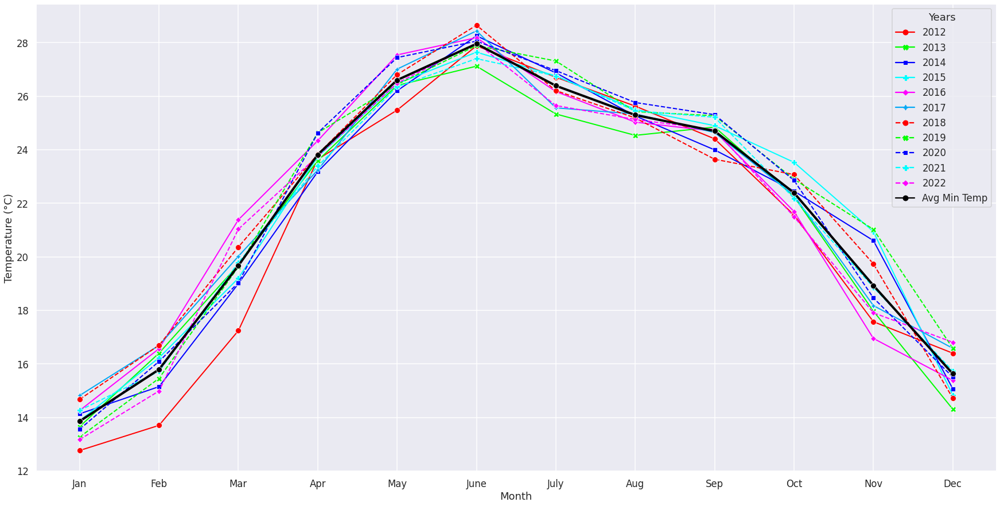

In [18]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data["Avg Min Temp"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg Min Temp"] = data.mean(axis=1)
monthly_stats["SD Min Temp"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 5]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Temperature (°C)",
    # title="Avg. Monthly Minimum Temperature",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

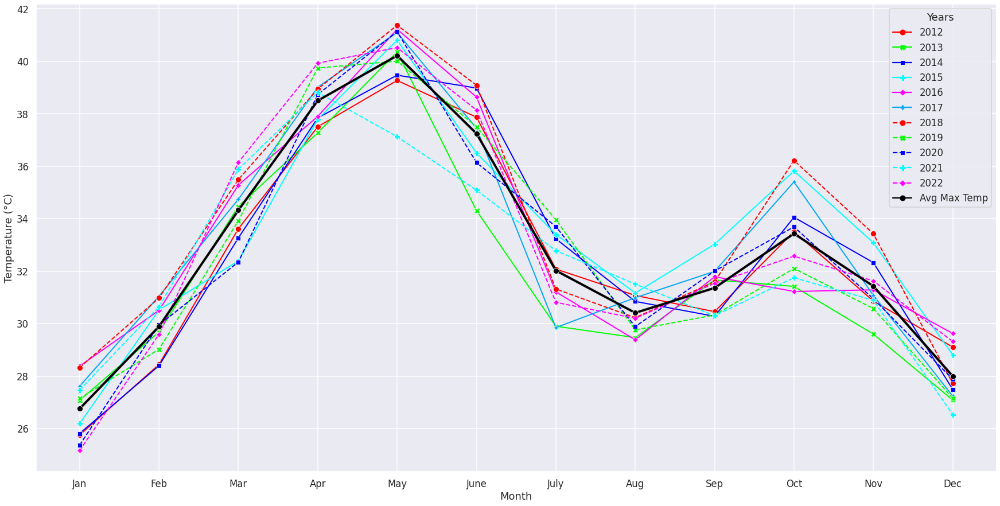

In [19]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data["Avg Max Temp"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg Max Temp"] = data.mean(axis=1)
monthly_stats["SD Max Temp"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 7]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Temperature (°C)",
    # title="Avg. Monthly Maximum Temperature",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

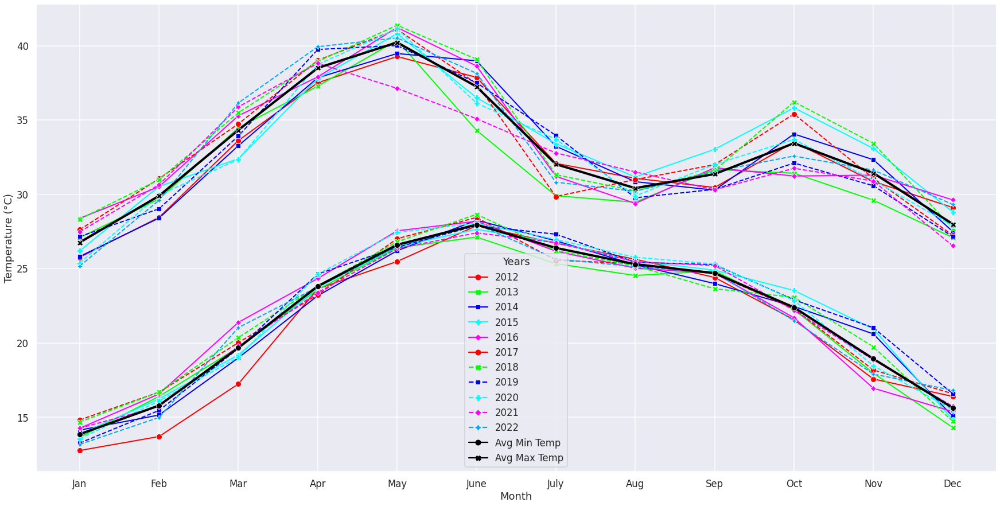

In [20]:
data1 = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data["Avg Min Temp"], 11))),
    columns=[x for x in range(2012, 2023)],
)
data2 = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data["Avg Max Temp"], 11))),
    columns=[x for x in range(2012, 2023)],
)
sns.lineplot(data=data1.iloc[:, 0:5], **display_options1)
sns.lineplot(data=data1.iloc[:, 5:11], **display_options2)
sns.lineplot(data=data2.iloc[:, 0:5], **display_options1, legend="")
sns.lineplot(data=data2.iloc[:, 5:11], **display_options2, legend="")
plot = sns.lineplot(
    data=monthly_stats.iloc[:, [0, 5, 7]],
    linewidth=4,
    markers=True,
    dashes=False,
    palette=["black", "black"],
    linestyle="solid",
    ms=10,
)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Temperature (°C)",
    # title="Avg. Monthly Min - Max Temperature",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

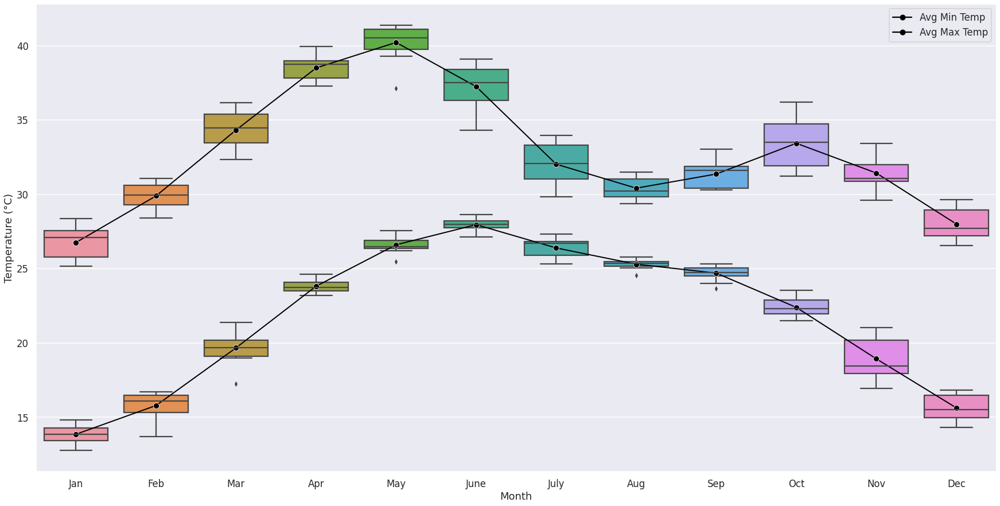

In [21]:
data = pd.DataFrame(columns=["Month", "Avg Min Temp", "Avg Max Temp"])
for i in range(1, 12):
    data = pd.concat([data, pd.DataFrame({"Month": months})], ignore_index=True)
data["Avg Min Temp"] = monthly_data["Avg Min Temp"]
data["Avg Max Temp"] = monthly_data["Avg Max Temp"]
sns.boxplot(x="Month", y="Avg Min Temp", data=data)
sns.boxplot(x="Month", y="Avg Max Temp", data=data)
sns.lineplot(data=monthly_stats.iloc[:, [0, 5]], **display_options4)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 7]], **display_options4)
plot.set(xlabel="Month", ylabel="Temperature (°C)");

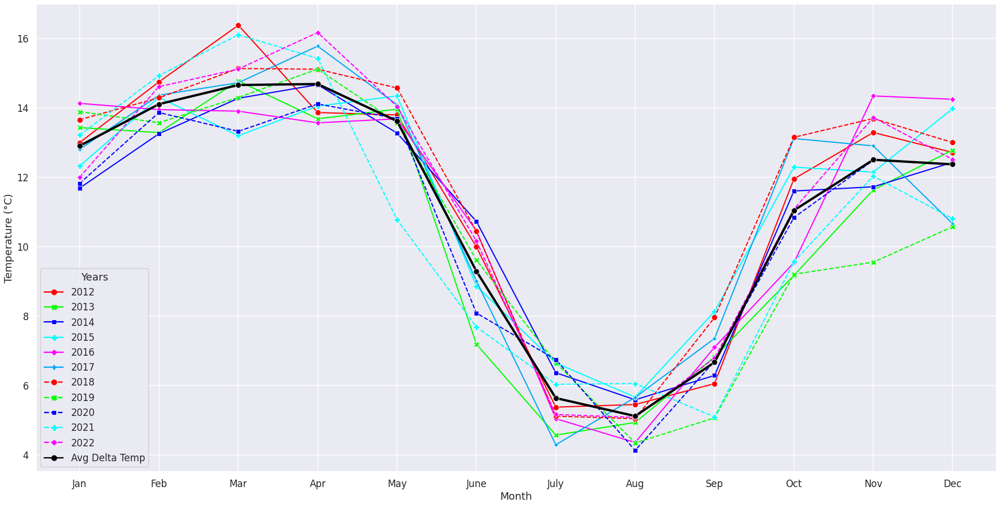

In [22]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data["Delta Temp"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg Delta Temp"] = data.mean(axis=1)
monthly_stats["SD Delta Temp"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 9]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Temperature (°C)",
    # title="Monthly Delta Temperature",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

**Compare with IMD data to check accuracy.**

In [23]:
min_temp_data_monthly_avg_imd = meteorological_data_imd.loc[:, "Minimum temperature average (°C)"][:612]
max_temp_data_monthly_avg_imd = meteorological_data_imd.loc[:, "Maximum temperature average (°C)"][:612]

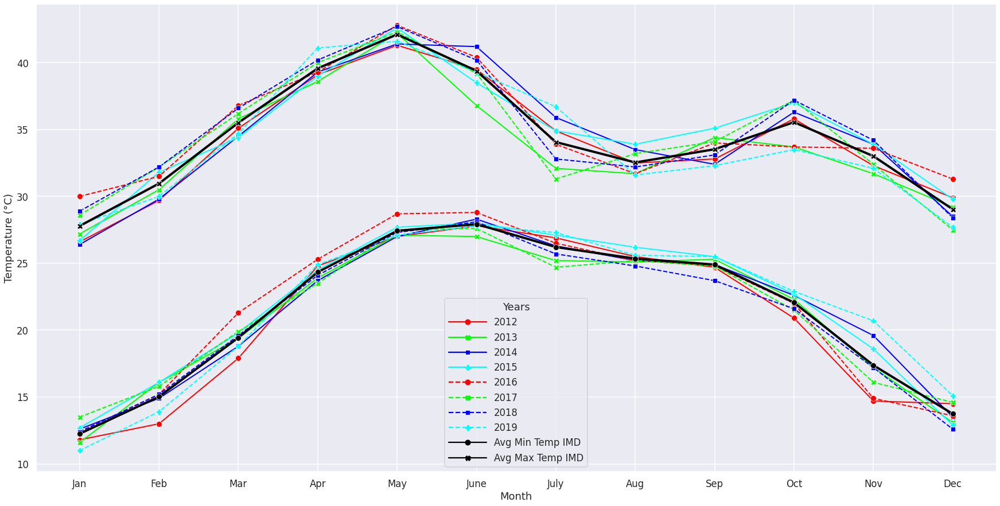

In [24]:
data1 = pd.DataFrame(
    np.transpose(np.vstack(np.split(min_temp_data_monthly_avg_imd.iloc[516:], 8))),
    columns=[x for x in range(2012, 2020)],
)
data1 = data1.assign(Months=months)
data2 = pd.DataFrame(
    np.transpose(np.vstack(np.split(max_temp_data_monthly_avg_imd.iloc[516:], 8))),
    columns=[x for x in range(2012, 2020)],
)
data2 = data2.assign(Months=months)
monthly_stats["Avg Min Temp IMD"] = data1.iloc[:, :-1].mean(axis=1)
monthly_stats["SD Min Temp IMD"] = data1.iloc[:, :-1].std(axis=1)
monthly_stats["Avg Max Temp IMD"] = data2.iloc[:, :-1].mean(axis=1)
monthly_stats["SD Max Temp IMD"] = data2.iloc[:, :-1].std(axis=1)
sns.lineplot(data=data1.iloc[:, 0:4], **display_options1)
sns.lineplot(data=data1.iloc[:, 4:8], **display_options2)
sns.lineplot(data=data2.iloc[:, 0:4], **display_options1, legend="")
sns.lineplot(data=data2.iloc[:, 4:8], **display_options2, legend="")
plot = sns.lineplot(
    data=monthly_stats.iloc[:, [0, 11, 13]],
    linewidth=4,
    markers=True,
    dashes=False,
    palette=["black", "black"],
    linestyle="solid",
    ms=10,
)
legend = plot.legend(title="Years", handlelength=4)
for i in range(4, 8):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Temperature (°C)",
    # title="Avg. Monthly Min - Max Temperature, Source: Indian Meteorological Department",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

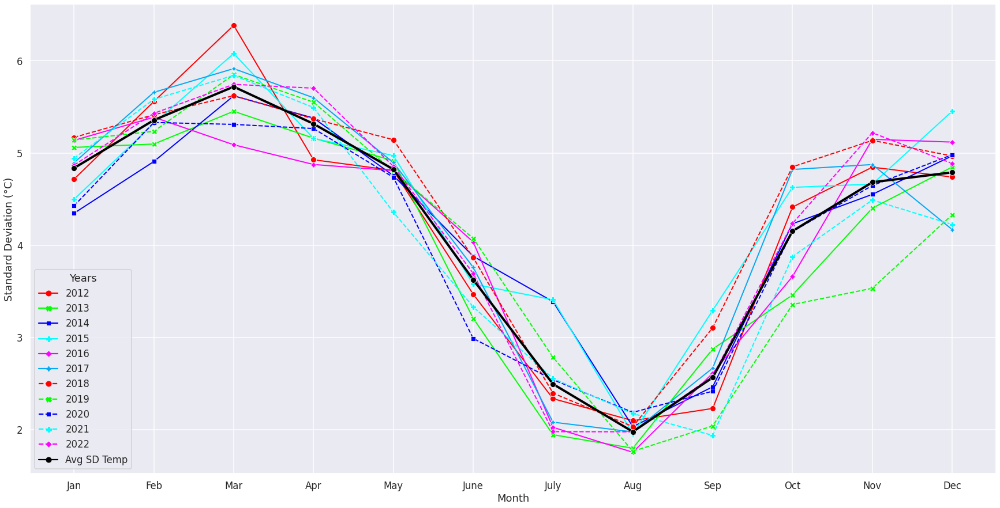

In [25]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data["SD Temp"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg SD Temp"] = data.mean(axis=1)
monthly_stats["SD SD Temp"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 15]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Standard Deviation (°C)",
    # title="Temperature Standard Deviation",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

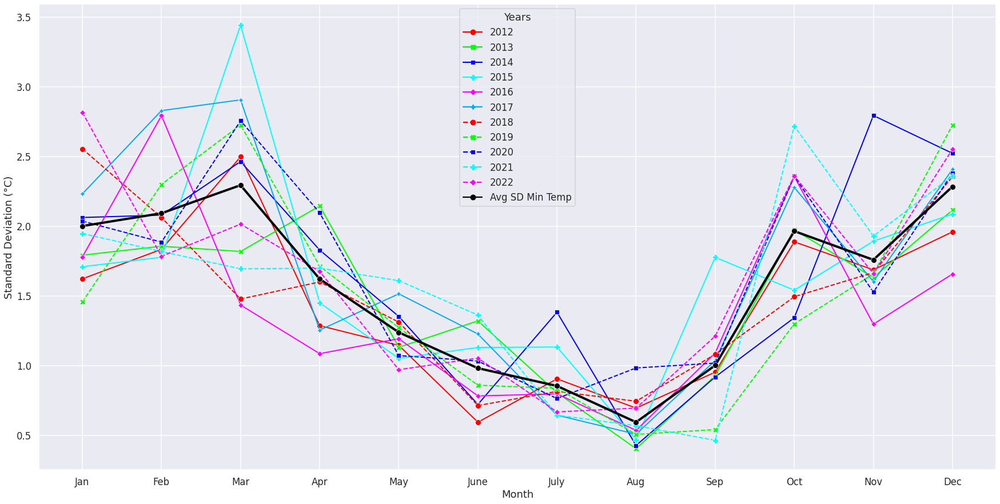

In [26]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data["SD Min Temp"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg SD Min Temp"] = data.mean(axis=1)
monthly_stats["SD SD Min Temp"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 17]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Standard Deviation (°C)",
    # title="Minimum Temperature Standard Deviation",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

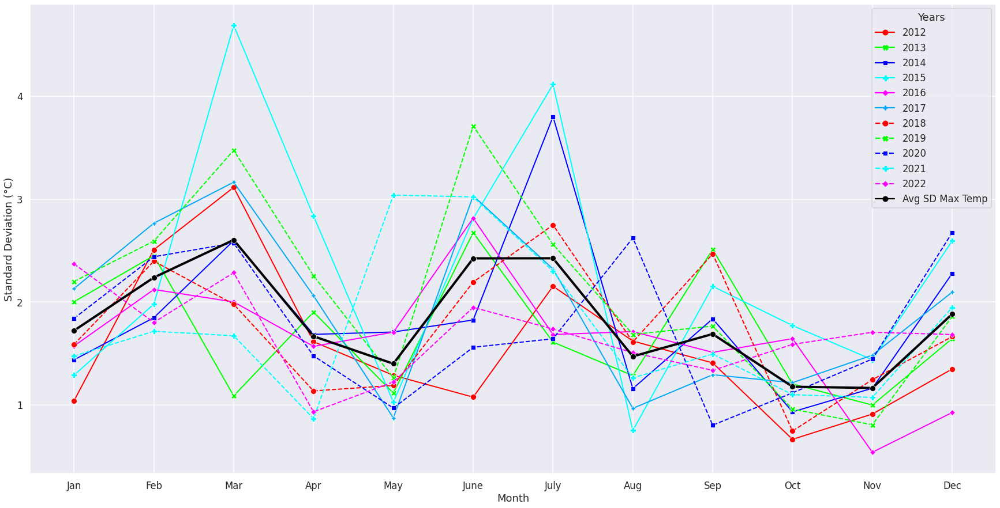

In [27]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data["SD Max Temp"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg SD Max Temp"] = data.mean(axis=1)
monthly_stats["SD SD Max Temp"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 19]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Standard Deviation (°C)",
    # title="Maximum Temperature Standard Deviation",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

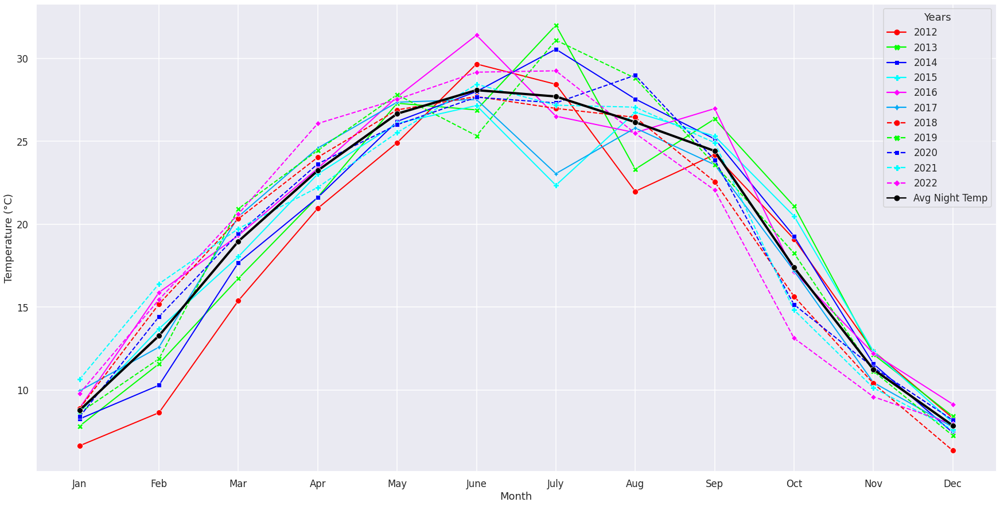

In [28]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data_lst["Avg Night Temp"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg Night Temp"] = data.mean(axis=1)
monthly_stats["SD Night Temp"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 21]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Temperature (°C)",
    # title="Avg. Monthly Night Land Surface Temperature",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

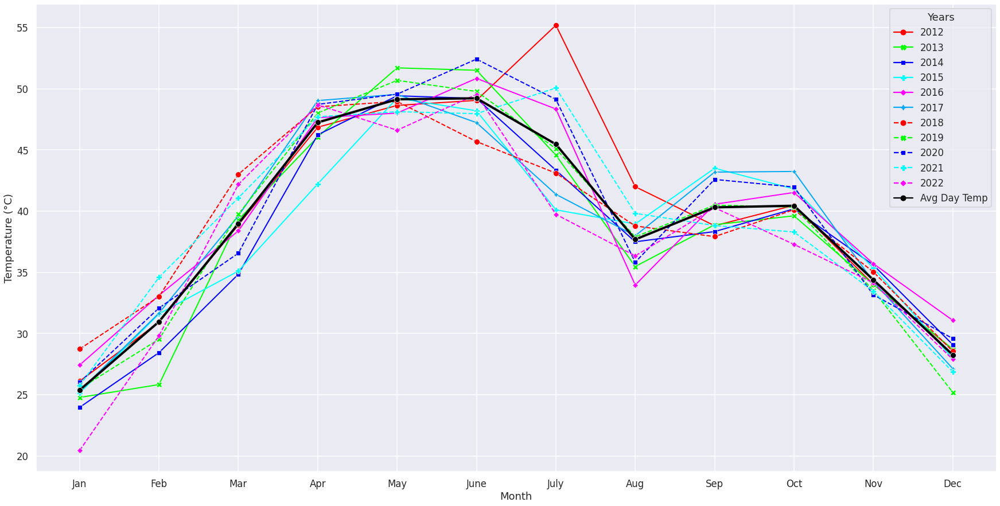

In [29]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data_lst["Avg Day Temp"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg Day Temp"] = data.mean(axis=1)
monthly_stats["SD Day Temp"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 23]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Temperature (°C)",
    # title="Avg. Monthly Day Land Surface Temperature",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

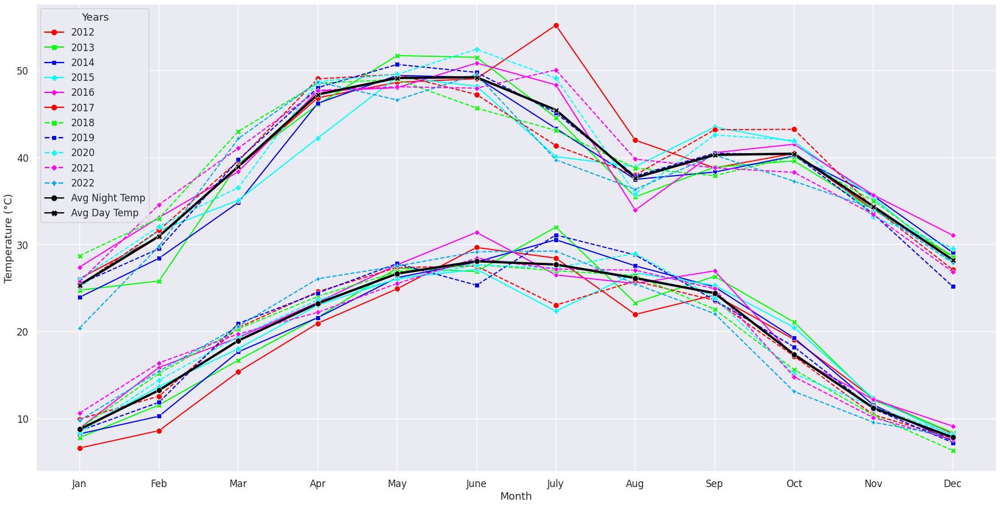

In [30]:
data1 = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data_lst["Avg Day Temp"], 11))),
    columns=[x for x in range(2012, 2023)],
)
data2 = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data_lst["Avg Night Temp"], 11))),
    columns=[x for x in range(2012, 2023)],
)
sns.lineplot(data=data1.iloc[:, 0:5], **display_options1)
sns.lineplot(data=data1.iloc[:, 5:11], **display_options2)
sns.lineplot(data=data2.iloc[:, 0:5], **display_options1, legend="")
sns.lineplot(data=data2.iloc[:, 5:11], **display_options2, legend="")
plot = sns.lineplot(
    data=monthly_stats.iloc[:, [0, 21, 23]],
    linewidth=4,
    markers=True,
    dashes=False,
    palette=["black", "black"],
    linestyle="solid",
    ms=10,
)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Temperature (°C)",
    # title="Avg. Monthly Day - Night Land Surface Temperature",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

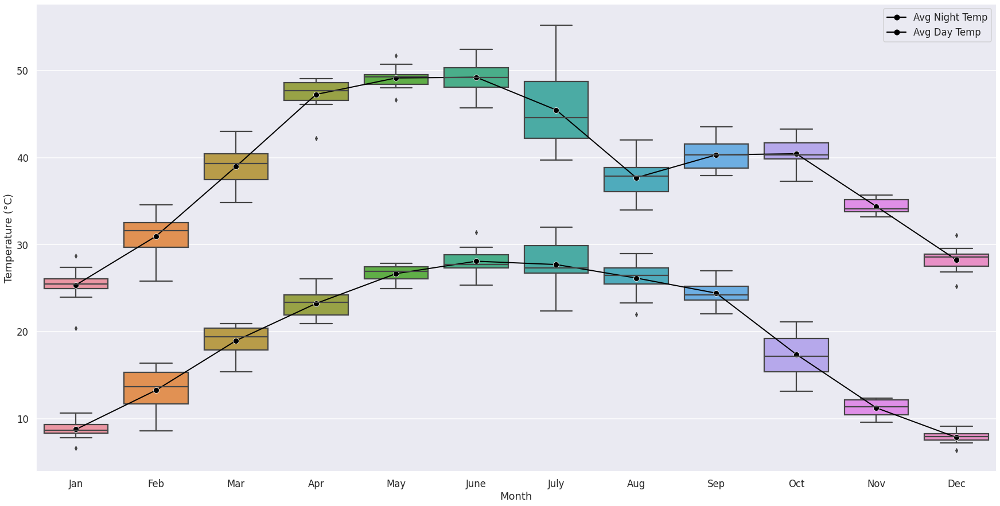

In [31]:
data = pd.DataFrame(columns=["Month", "Avg Night Temp", "Avg Day Temp"])
for i in range(1, 12):
    data = pd.concat([data, pd.DataFrame({"Month": months})], ignore_index=True)
data["Avg Night Temp"] = monthly_data_lst["Avg Night Temp"]
data["Avg Day Temp"] = monthly_data_lst["Avg Day Temp"]
sns.boxplot(x="Month", y="Avg Night Temp", data=data)
sns.boxplot(x="Month", y="Avg Day Temp", data=data)
sns.lineplot(data=monthly_stats.iloc[:, [0, 21]], **display_options4)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 23]], **display_options4)
plot.set(xlabel="Month", ylabel="Temperature (°C)");

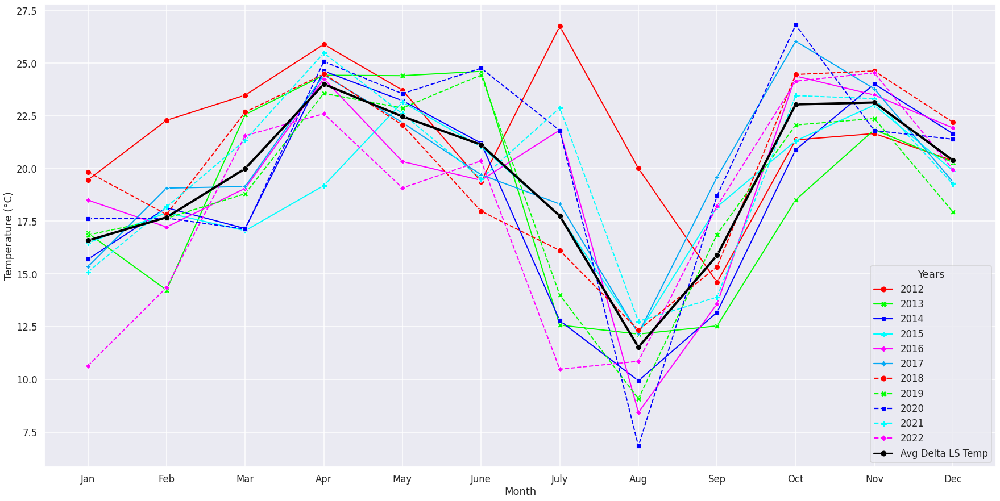

In [32]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data_lst["Delta Temp"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg Delta LS Temp"] = data.mean(axis=1)
monthly_stats["SD Delta LS Temp"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 25]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Temperature (°C)",
    # title="Monthly Delta Land Surface Temperature",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

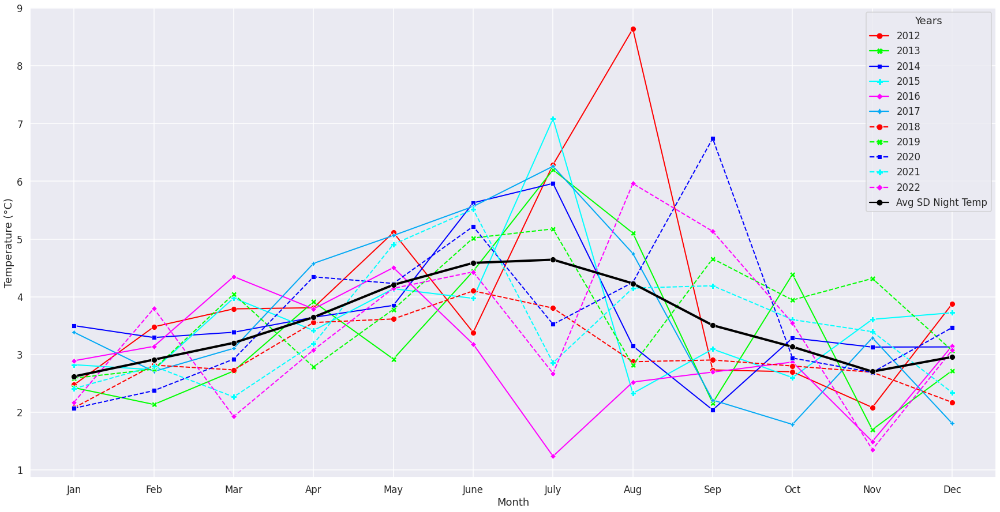

In [33]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data_lst["SD Night Temp"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg SD Night Temp"] = data.mean(axis=1)
monthly_stats["SD SD Night Temp"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 27]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Temperature (°C)",
    # title="Night Land Surface Temperature Standard Deviation",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

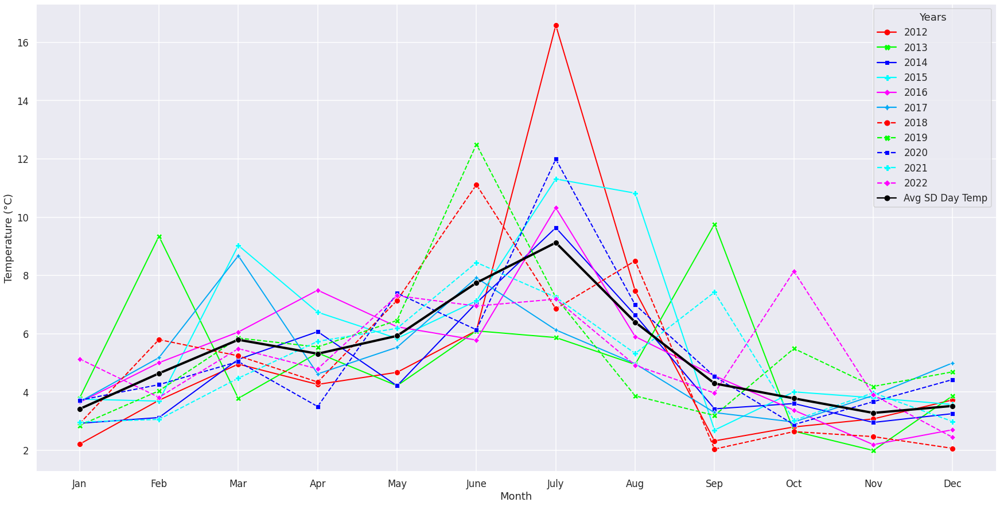

In [34]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data_lst["SD Day Temp"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg SD Day Temp"] = data.mean(axis=1)
monthly_stats["SD SD Day Temp"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 29]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Temperature (°C)",
    # title="Day Land Surface Temperature Standard Deviation",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

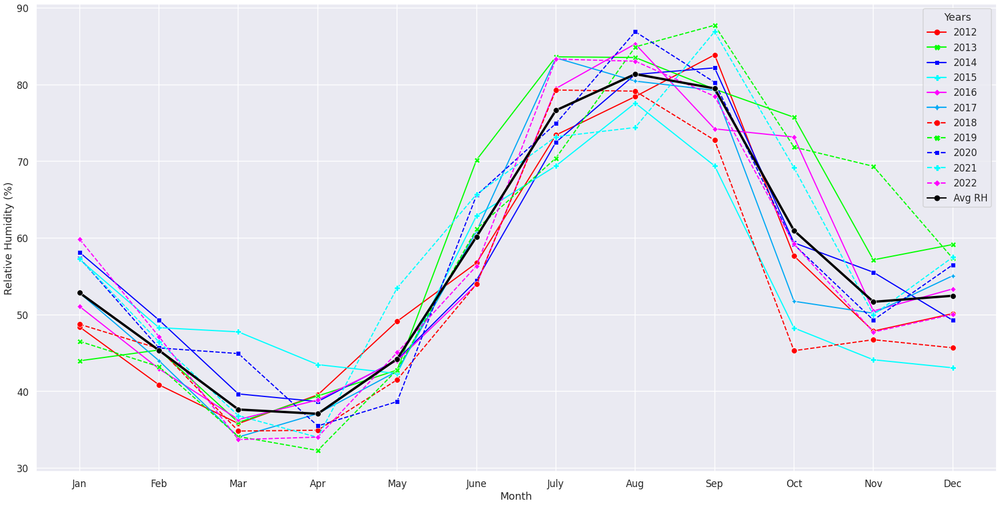

In [35]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data["Avg RH"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg RH"] = data.mean(axis=1)
monthly_stats["SD RH"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 31]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Relative Humidity (%)",
    # title="Avg. Monthly Relative Humidity",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

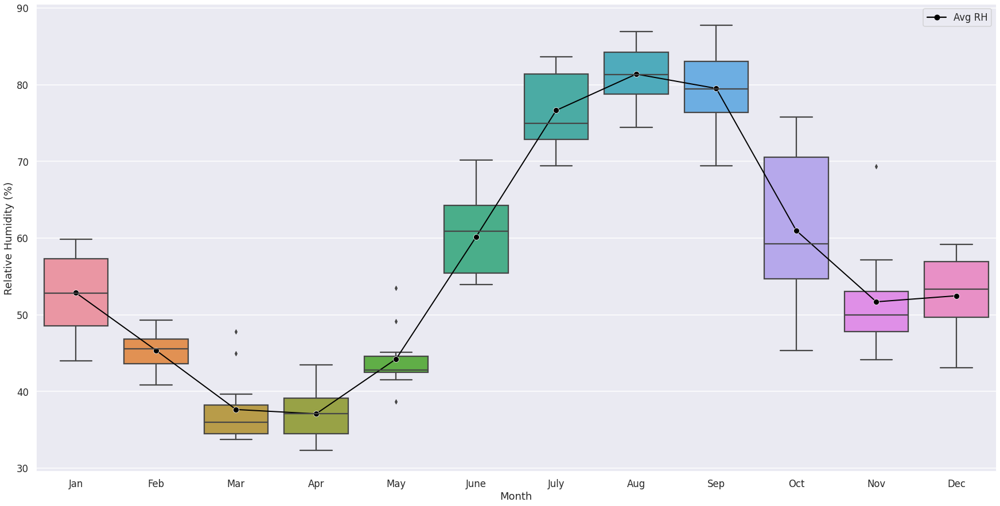

In [36]:
data = pd.DataFrame(columns=["Month", "Avg RH"])
for i in range(1, 12):
    data = pd.concat([data, pd.DataFrame({"Month": months})], ignore_index=True)
data["Avg RH"] = monthly_data["Avg RH"]
sns.boxplot(x="Month", y="Avg RH", data=data)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 31]], **display_options4)
plot.set(xlabel="Month", ylabel="Relative Humidity (%)");

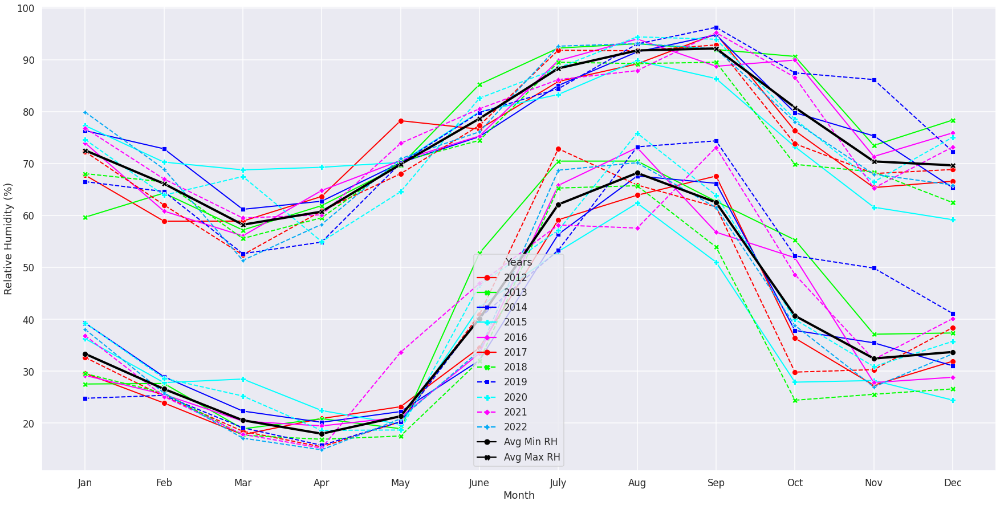

In [37]:
data1 = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data["Avg Min RH"], 11))),
    columns=[x for x in range(2012, 2023)],
)
data2 = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data["Avg Max RH"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg Min RH"] = data1.iloc[:, 1:12].mean(axis=1)
monthly_stats["SD Min RH"] = data1.iloc[:, 1:12].std(axis=1)
monthly_stats["Avg Max RH"] = data2.iloc[:, 1:12].mean(axis=1)
monthly_stats["SD Max RH"] = data2.iloc[:, 1:12].std(axis=1)
sns.lineplot(data=data1.iloc[:, 0:5], **display_options1)
sns.lineplot(data=data1.iloc[:, 5:11], **display_options2)
sns.lineplot(data=data2.iloc[:, 0:5], **display_options1, legend="")
sns.lineplot(data=data2.iloc[:, 5:11], **display_options2, legend="")
plot = sns.lineplot(
    data=monthly_stats.iloc[:, [0, 33, 35]],
    linewidth=4,
    markers=True,
    dashes=False,
    palette=["black", "black"],
    linestyle="solid",
    ms=10,
)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Relative Humidity (%)",
    # title="Avg. Monthly Min - Max Relative Humidity",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

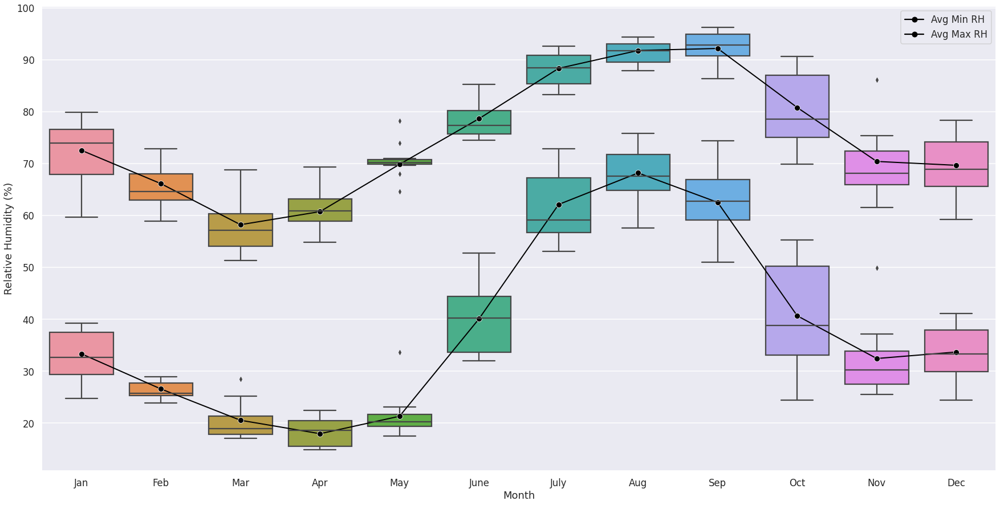

In [38]:
data = pd.DataFrame(columns=["Month", "Avg Min RH", "Avg Max RH"])
for i in range(1, 12):
    data = pd.concat([data, pd.DataFrame({"Month": months})], ignore_index=True)
data["Avg Min RH"] = monthly_data["Avg Min RH"]
data["Avg Max RH"] = monthly_data["Avg Max RH"]
sns.boxplot(x="Month", y="Avg Min RH", data=data)
sns.boxplot(x="Month", y="Avg Max RH", data=data)
sns.lineplot(data=monthly_stats.iloc[:, [0, 33]], **display_options4)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 35]], **display_options4)
plot.set(
    xlabel="Month",
    ylabel="Relative Humidity (%)",
);

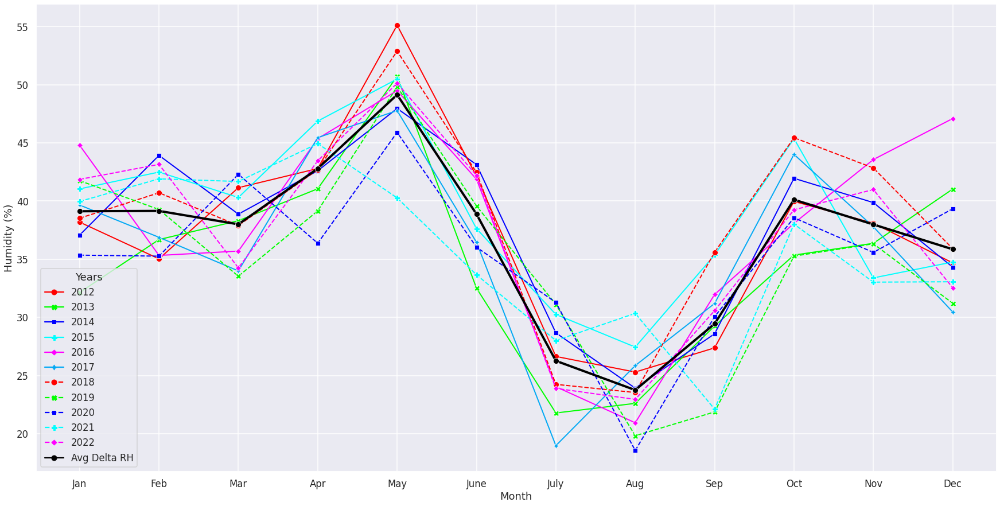

In [39]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data["Delta RH"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg Delta RH"] = data.mean(axis=1)
monthly_stats["SD Delta RH"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 37]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Humidity (%)",
    # title="Monthly Delta Relative Humidity",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

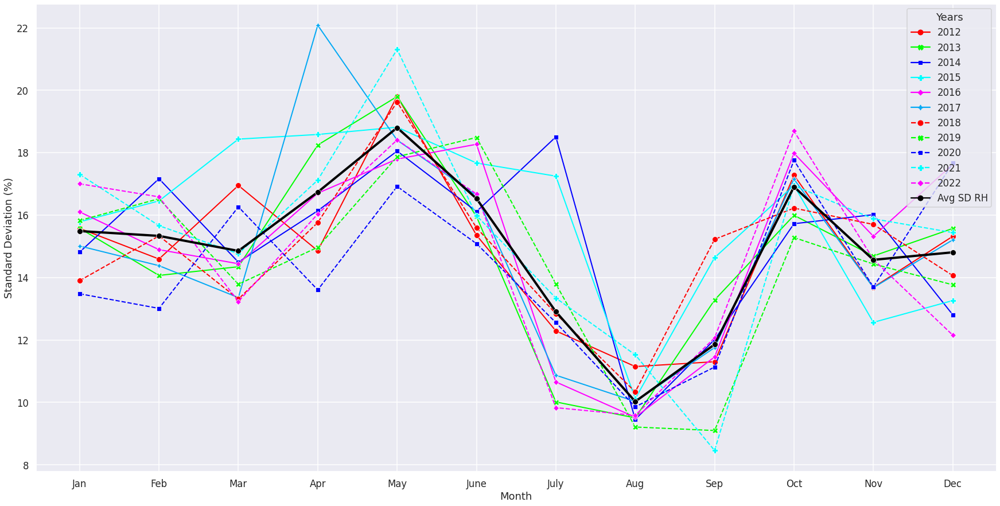

In [40]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data["SD RH"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg SD RH"] = data.mean(axis=1)
monthly_stats["SD SD RH"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 39]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Standard Deviation (%)",
    # title="Humidity Standard Deviation",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

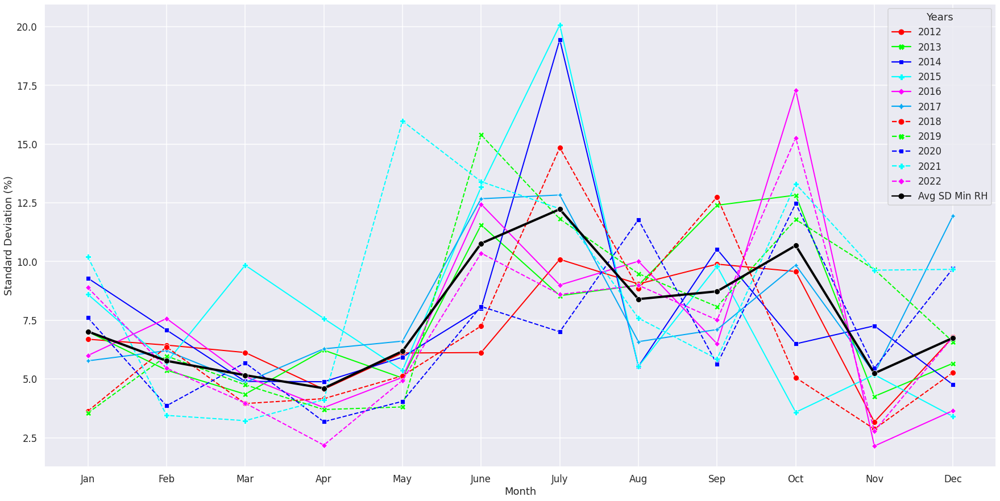

In [41]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data["SD Min RH"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg SD Min RH"] = data.mean(axis=1)
monthly_stats["SD SD Min RH"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 41]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Standard Deviation (%)",
    # title="Minimum Humidity Standard Deviation",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

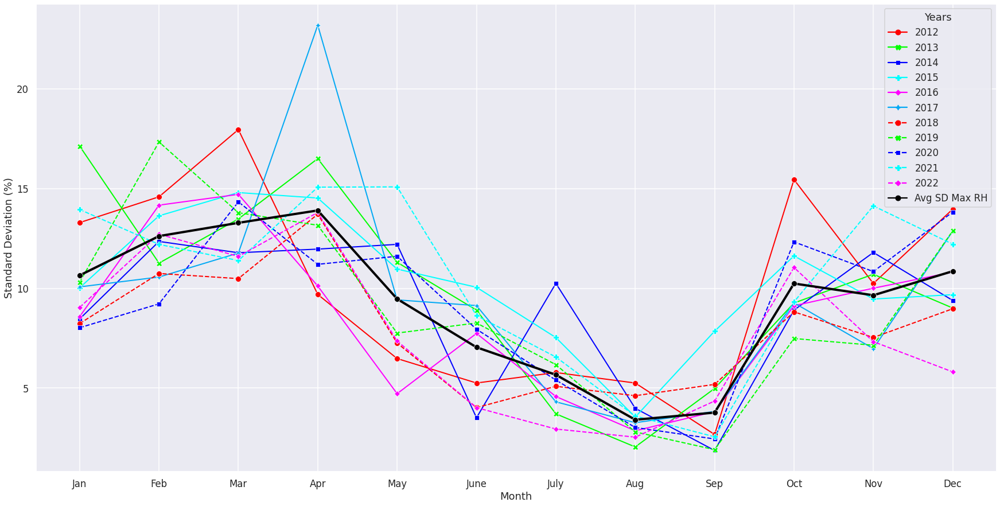

In [42]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(monthly_data["SD Max RH"], 11))),
    columns=[x for x in range(2012, 2023)],
)
monthly_stats["Avg SD Max RH"] = data.mean(axis=1)
monthly_stats["SD SD Max RH"] = data.std(axis=1)
sns.lineplot(data=data.iloc[:, 0:6], **display_options1)
sns.lineplot(data=data.iloc[:, 6:], **display_options2)
plot = sns.lineplot(data=monthly_stats.iloc[:, [0, 43]], **display_options3)
legend = plot.legend(title="Years")
for i in range(6, 11):
    legend.get_lines()[i].set_linestyle("--")
plot.set(
    xlabel="Month",
    ylabel="Standard Deviation (%)",
    # title="Maximum Humidity Standard Deviation",
)
plot.set_xticks(months.index), plot.set_xticklabels(months);

In [43]:
monthly_stats.to_csv("/content/drive/MyDrive/Ahmedabad University/Research Assistantship/MonthlyStats.csv")

The relative humidity peaks around the months Aug - Sep and dengue cases peak around Sep - Oct. Now, I find the association between dengue cases and humidity, by drawing a scatterplot diagram.


In [44]:
# Store monthly dengue cases data
dengue_cases_data = []
for i in range(1, 12):
    dengue_cases_data.extend(dengue_data.iloc[:, i])

In [45]:
sns.set_theme(context="talk", palette="bright")

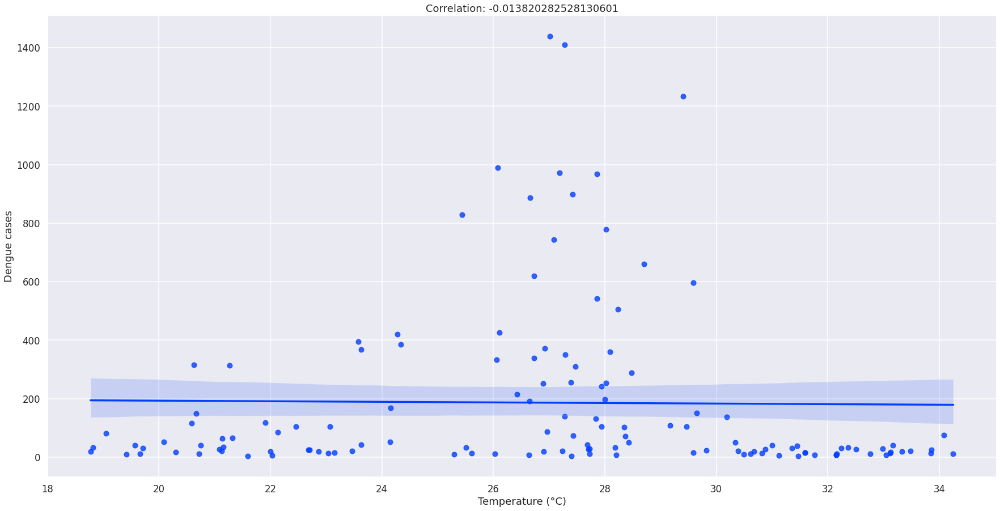

In [46]:
data = pd.DataFrame(
    zip(monthly_data["Avg Temp"], dengue_cases_data),
    columns=["Avg Temp", "Dengue Cases"],
)
corr_coef = np.corrcoef(monthly_data["Avg Temp"], dengue_cases_data)[0][1]
plot = sns.regplot(data=data, x="Avg Temp", y="Dengue Cases")
plot.set(
    xlabel="Temperature (°C)",
    ylabel="Dengue cases",
    # title=f"Monthly Dengue Cases vs. Avg. Monthly Temperature (2012 - 2021), Correlation: {corr_coef}",
    title=f"Correlation: {corr_coef}",
);

In [47]:
# Store log of monthly dengue cases data excluding last year
dengue_cases_data_log = []
for i in range(1, 12):
    dengue_cases_data_log.extend(dengue_data_log.iloc[:, i])

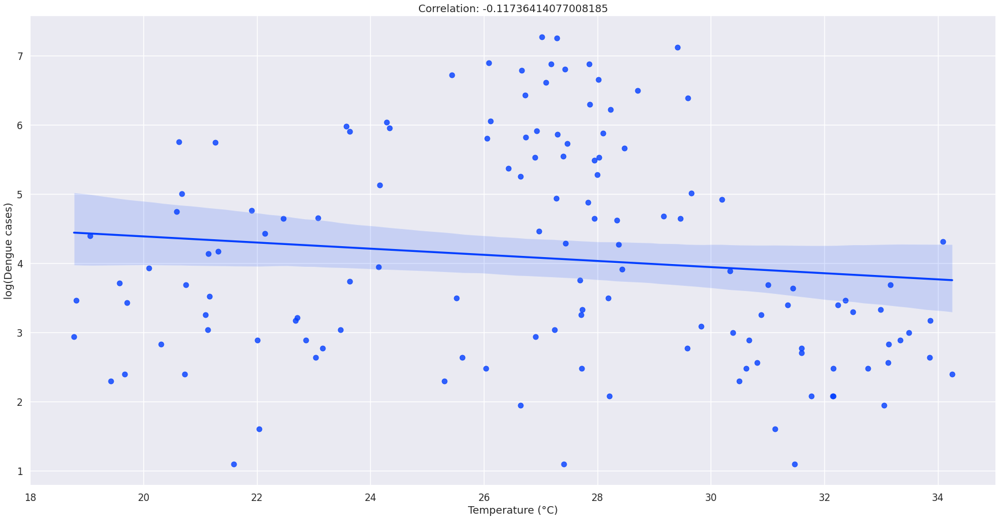

In [48]:
data = pd.DataFrame(
    zip(monthly_data["Avg Temp"], dengue_cases_data_log),
    columns=["Avg Temp", "Log Dengue Cases"],
)
corr_coef = np.corrcoef(monthly_data["Avg Temp"], dengue_cases_data_log)[0][1]
plot = sns.regplot(data=data, x="Avg Temp", y="Log Dengue Cases")
plot.set(
    xlabel="Temperature (°C)",
    ylabel="log(Dengue cases)",
    # title=f"log(Monthly Dengue Cases) vs. Avg. Monthly Temperature (2012 - 2021), Correlation: {corr_coef}",
    title=f"Correlation: {corr_coef}",
);

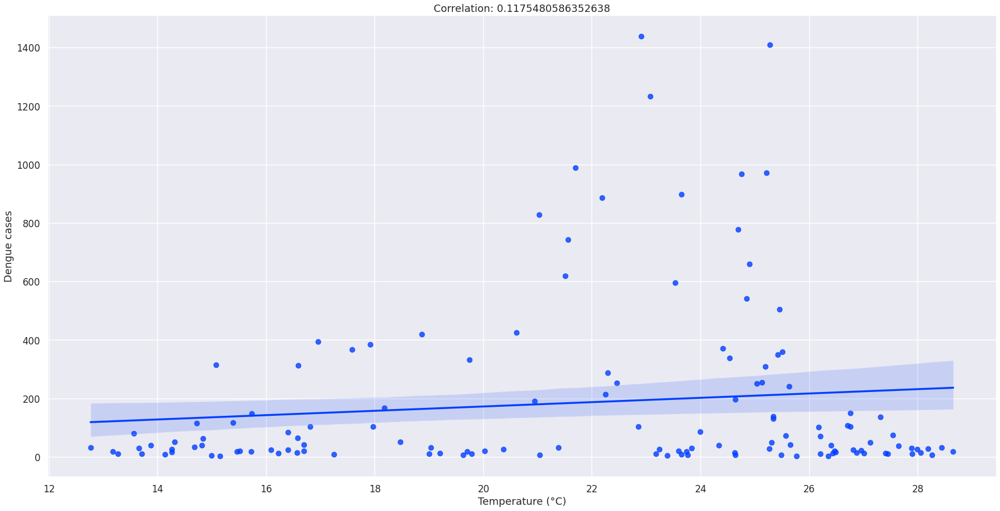

In [49]:
data = pd.DataFrame(
    zip(monthly_data["Avg Min Temp"], dengue_cases_data),
    columns=["Avg Min Temp", "Dengue Cases"],
)
corr_coef = np.corrcoef(monthly_data["Avg Min Temp"], dengue_cases_data)[0][1]
plot = sns.regplot(data=data, x="Avg Min Temp", y="Dengue Cases")
plot.set(
    xlabel="Temperature (°C)",
    ylabel="Dengue cases",
    # title=f"Monthly Dengue Cases vs. Avg. Monthly Minimum Temperature (2012 - 2021), Correlation: {corr_coef}",
    title=f"Correlation: {corr_coef}",
);

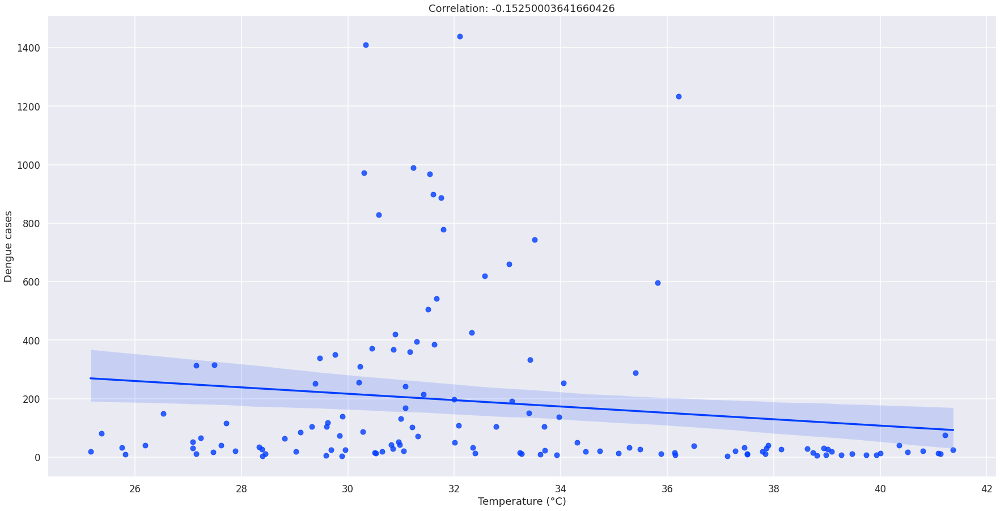

In [50]:
data = pd.DataFrame(
    zip(monthly_data["Avg Max Temp"], dengue_cases_data),
    columns=["Avg Max Temp", "Dengue Cases"],
)
corr_coef = np.corrcoef(monthly_data["Avg Max Temp"], dengue_cases_data)[0][1]
plot = sns.regplot(data=data, x="Avg Max Temp", y="Dengue Cases")
plot.set(
    xlabel="Temperature (°C)",
    ylabel="Dengue cases",
    # title=f"Monthly Dengue Cases vs. Avg. Monthly Maximum Temperature (2012 - 2021), Correlation: {corr_coef}",
    title=f"Correlation: {corr_coef}",
);

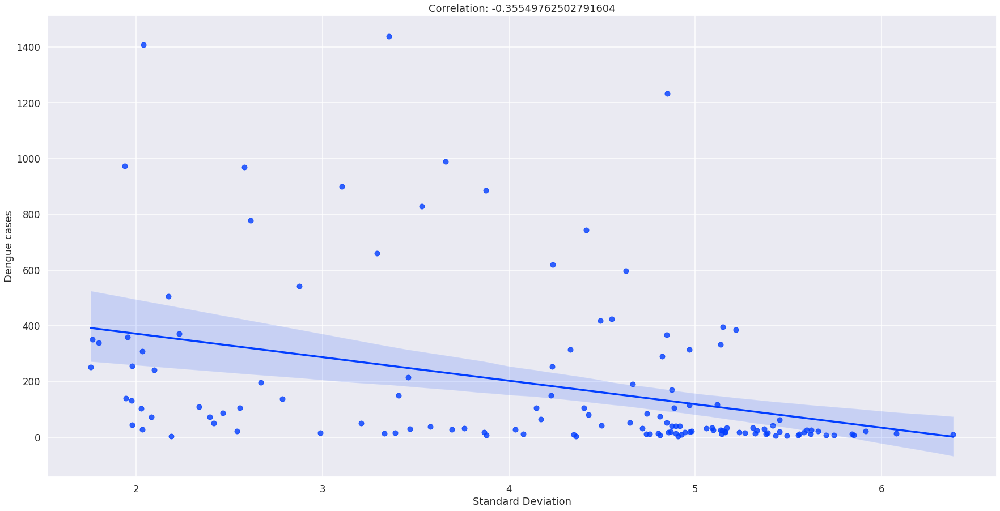

In [51]:
data = pd.DataFrame(
    zip(monthly_data["SD Temp"], dengue_cases_data),
    columns=["SD Temp", "Dengue Cases"],
)
corr_coef = np.corrcoef(monthly_data["SD Temp"], dengue_cases_data)[0][1]
plot = sns.regplot(data=data, x="SD Temp", y="Dengue Cases")
plot.set(
    xlabel="Standard Deviation",
    ylabel="Dengue cases",
    # title=f"Monthly Dengue Cases vs. Monthly Temperature Standard Deviation (2012 - 2021), Correlation: {corr_coef}",
    title=f"Correlation: {corr_coef}",
);

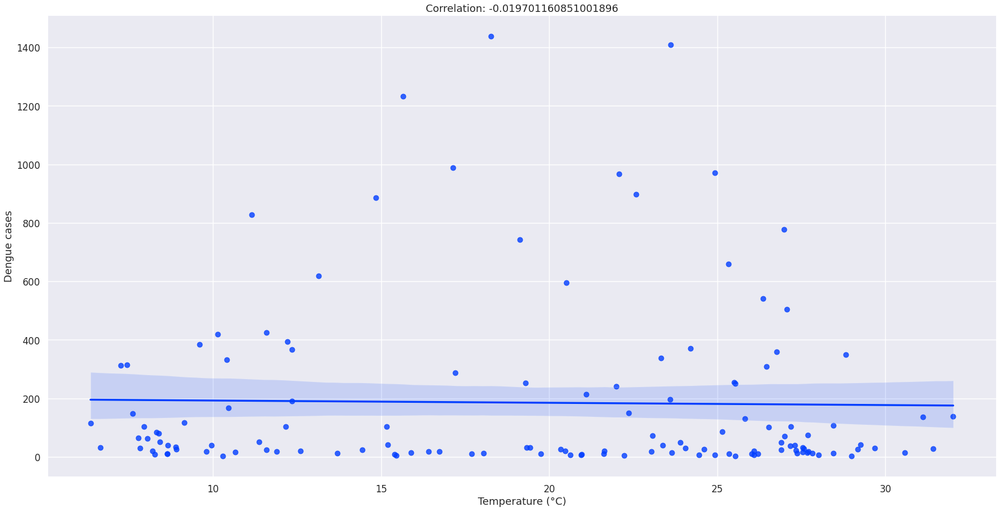

In [52]:
data = pd.DataFrame(
    zip(monthly_data_lst["Avg Night Temp"], dengue_cases_data),
    columns=["Avg Night Temp", "Dengue Cases"],
)
corr_coef = np.corrcoef(monthly_data_lst["Avg Night Temp"], dengue_cases_data)[0][1]
plot = sns.regplot(data=data, x="Avg Night Temp", y="Dengue Cases")
plot.set(
    xlabel="Temperature (°C)",
    ylabel="Dengue cases",
    # title=f"Monthly Dengue Cases vs. Avg. Monthly Night Land Surface Temperature (2012 - 2021), Correlation: {corr_coef}",
    title=f"Correlation: {corr_coef}",
);

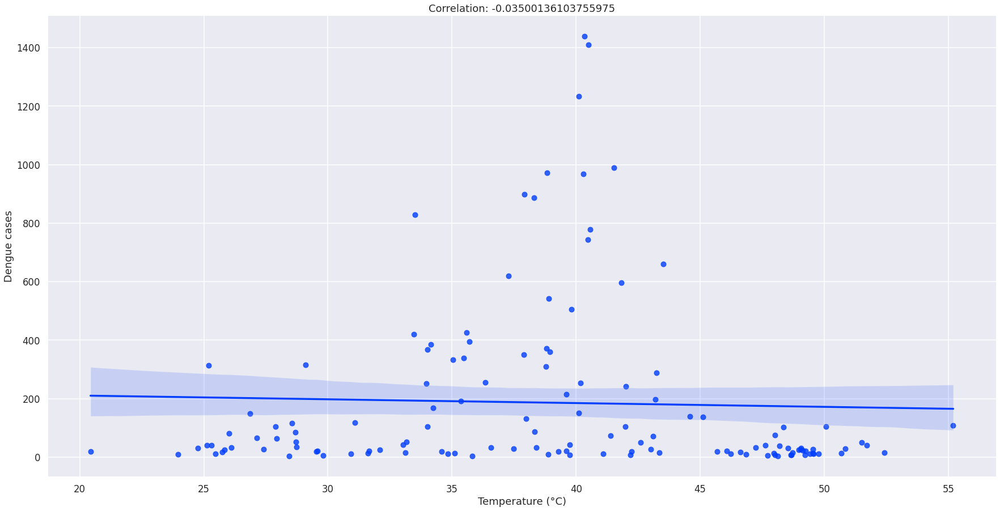

In [53]:
data = pd.DataFrame(
    zip(monthly_data_lst["Avg Day Temp"], dengue_cases_data),
    columns=["Avg Day Temp", "Dengue Cases"],
)
corr_coef = np.corrcoef(monthly_data_lst["Avg Day Temp"], dengue_cases_data)[0][1]
plot = sns.regplot(data=data, x="Avg Day Temp", y="Dengue Cases")
plot.set(
    xlabel="Temperature (°C)",
    ylabel="Dengue cases",
    # title=f"Monthly Dengue Cases vs. Avg. Monthly Day Land Surface Temperature (2012 - 2021), Correlation: {corr_coef}",
    title=f"Correlation: {corr_coef}",
);

In [54]:
# Store monsoon monthly dengue cases data excluding last year
dengue_cases_data_mon = []
for i in range(1, 12):
    dengue_cases_data_mon.extend(dengue_data.iloc[:, i][6:11])

In [55]:
# Store log of monsoon monthly dengue cases data excluding last year
dengue_cases_data_mon_log = []
for i in range(1, 12):
    dengue_cases_data_mon_log.extend(dengue_data_log.iloc[:, i][6:11])

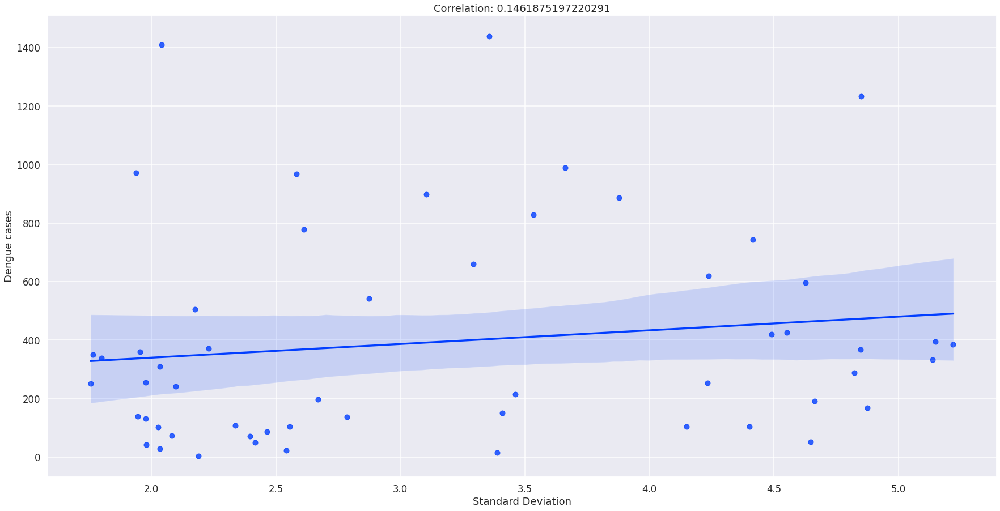

In [56]:
sd_temp_mon = []
for i in range(6, 132, 12):
    sd_temp_mon.extend(monthly_data["SD Temp"][i : i + 5])
data = pd.DataFrame(
    zip(sd_temp_mon, dengue_cases_data_mon),
    columns=["SD Temp", "Dengue Cases"],
)
corr_coef = np.corrcoef(sd_temp_mon, dengue_cases_data_mon)[0][1]
plot = sns.regplot(data=data, x="SD Temp", y="Dengue Cases")
plot.set(
    xlabel="Standard Deviation",
    ylabel="Dengue cases",
    # title=f"Monthly Dengue Cases vs. Monsoon Temperature Standard Deviation (2012 - 2021), Correlation: {corr_coef}",
    title=f"Correlation: {corr_coef}",
);

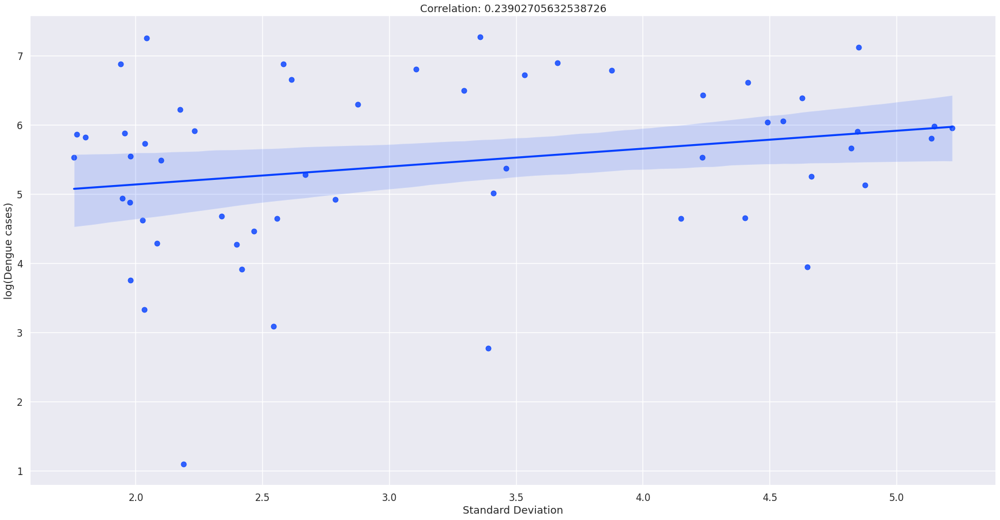

In [57]:
sd_temp_mon = []
for i in range(6, 132, 12):
    sd_temp_mon.extend(monthly_data["SD Temp"][i : i + 5])
data = pd.DataFrame(
    zip(sd_temp_mon, dengue_cases_data_mon_log),
    columns=["SD Temp", "Dengue Cases"],
)
corr_coef = np.corrcoef(sd_temp_mon, dengue_cases_data_mon_log)[0][1]
plot = sns.regplot(data=data, x="SD Temp", y="Dengue Cases")
plot.set(
    xlabel="Standard Deviation",
    ylabel="log(Dengue cases)",
    # title=f"log(Monthly Dengue Cases) vs. Monsoon Temperature Standard Deviation (2012 - 2021), Correlation: {corr_coef}",
    title=f"Correlation: {corr_coef}",
);

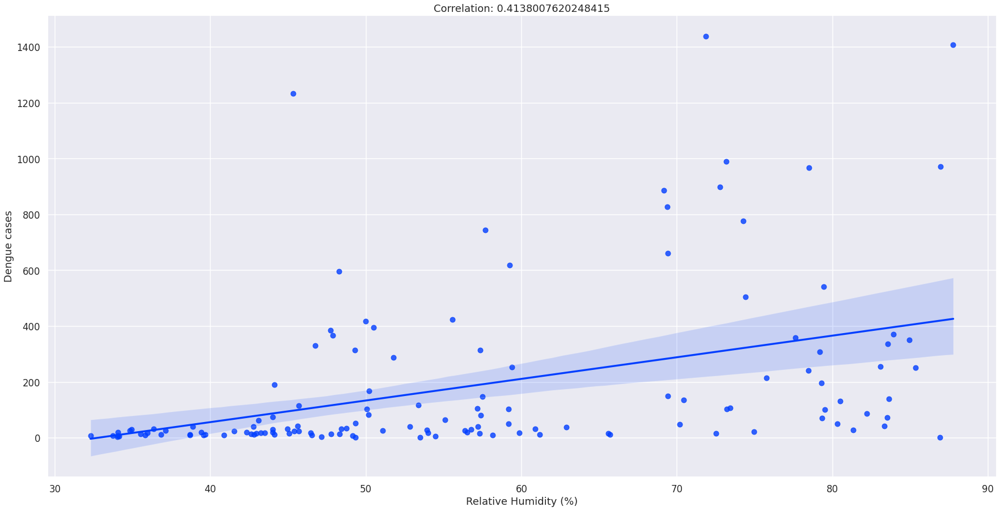

In [58]:
data = pd.DataFrame(
    zip(monthly_data["Avg RH"], dengue_cases_data),
    columns=["Avg RH", "Dengue Cases"],
)
corr_coef = np.corrcoef(monthly_data["Avg RH"], dengue_cases_data)[0][1]
plot = sns.regplot(data=data, x="Avg RH", y="Dengue Cases")
plot.set(
    xlabel="Relative Humidity (%)",
    ylabel="Dengue cases",
    # title=f"Monthly Dengue Cases vs. Avg. Monthly Relative Humidity (2012 - 2021), Correlation: {corr_coef}",
    title=f"Correlation: {corr_coef}",
);

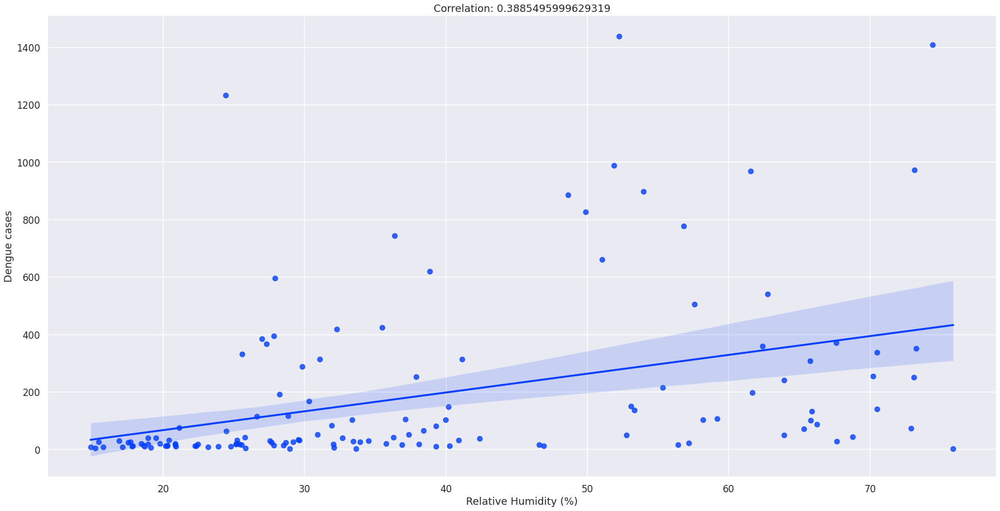

In [59]:
data = pd.DataFrame(
    zip(monthly_data["Avg Min RH"], dengue_cases_data),
    columns=["Avg Min RH", "Dengue Cases"],
)
corr_coef = np.corrcoef(monthly_data["Avg Min RH"], dengue_cases_data)[0][1]
plot = sns.regplot(data=data, x="Avg Min RH", y="Dengue Cases")
plot.set(
    xlabel="Relative Humidity (%)",
    ylabel="Dengue cases",
    # title=f"Monthly Dengue Cases vs. Avg. Monthly Minimum Relative Humidity (2012 - 2021), Correlation: {corr_coef}",
    title=f"Correlation: {corr_coef}",
);

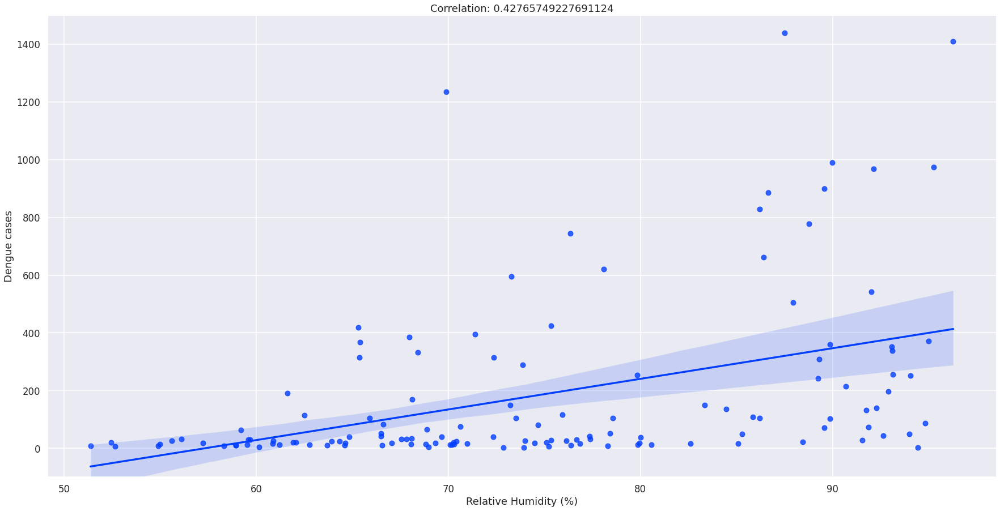

In [60]:
data = pd.DataFrame(
    zip(monthly_data["Avg Max RH"], dengue_cases_data),
    columns=["Avg Max RH", "Dengue Cases"],
)
corr_coef = np.corrcoef(monthly_data["Avg Max RH"], dengue_cases_data)[0][1]
plot = sns.regplot(data=data, x="Avg Max RH", y="Dengue Cases")
plot.set(
    xlabel="Relative Humidity (%)",
    ylabel="Dengue cases",
    # title=f"Monthly Dengue Cases vs. Avg. Monthly Maximum Relative Humidity (2012 - 2021), Correlation: {corr_coef}",
    title=f"Correlation: {corr_coef}",
)
plot.set_ylim(-100, 1500);

**Skip two data points to equally divide into 10 parts.**


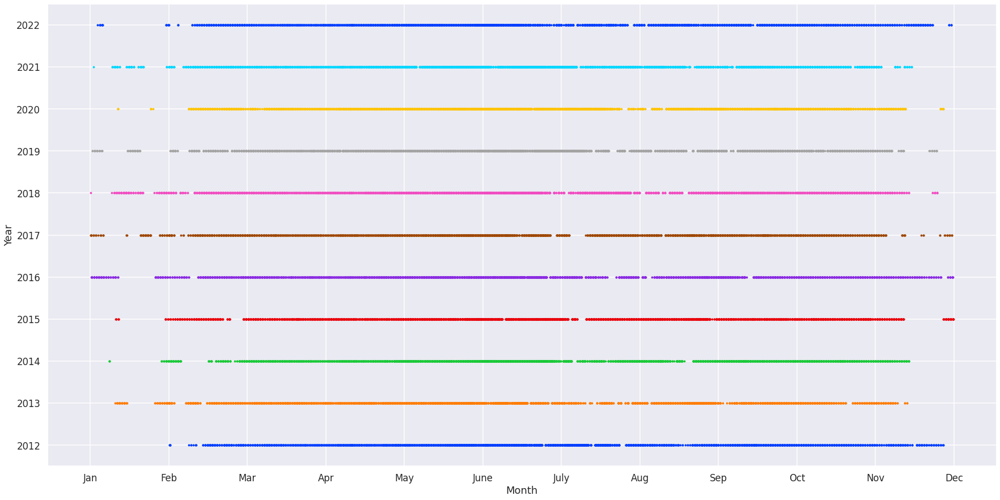

In [61]:
data = pd.DataFrame(
    np.transpose(np.vstack(np.split(meteorological_data.iloc[1:96427, 1], 11))),
    columns=[x for x in range(2012, 2023)],
)
low, high = 28, 34
for i in range(11):
    temps = np.array(data.iloc[:, i])
    idxs = np.where((temps >= low) & (temps <= high))[0].tolist()
    plot_data = pd.DataFrame(zip(idxs, [i + 2012 for j in range(len(idxs))]), columns=["Index", "Year"])
    plot = sns.scatterplot(data=plot_data, x="Index", y="Year", linewidth=0, s=15)
    plot.set(
        xlabel="Month",
        ylabel="Year",
        # title=f"Hourly Temperature Points Between {low} - {high} °C",
    )
    plot.set_xticks([x * 796.909090909 for x in range(0, 12)])
    plot.set_yticks(range(2012, 2023))
    plot.set_xticklabels(months);

In [62]:
data = pd.DataFrame(
    zip(monthly_data["Avg Temp"], monthly_data["Avg RH"], dengue_cases_data),
    columns=["Avg Temp", "Avg RH", "Dengue Cases"],
)
binned_data = []
binned_data_sum = []
binned_datapoint_count = []
for i in range(6, 15):
    for j in range(10, 100, 10):
        query = f"`Avg Temp` >= {i*2.5} and `Avg Temp` < {(i+1)*2.5} and `Avg RH` >= {j} and `Avg RH` < {j+10}"
        result = data.query(query)["Dengue Cases"]
        binned_data.append(result.mean())
        binned_data_sum.append(result.sum())
        binned_datapoint_count.append(len(result))

# indices = data.query(f"`Avg Temp` >= {27.5} and `Avg Temp` < {30.0} and `Avg RH` >= {70} and `Avg RH` < {80}").index.tolist()
# print(indices)
# print(monthly_data.iloc[indices, :])

temps = [f"{i*2.5}-{(i+1)*2.5}" for i in range(6, 15)]
binned_data = [0 if math.isnan(x) else x for x in binned_data]
binned_data = pd.DataFrame(
    np.vstack(np.split(np.array(binned_data), 9)),
    columns=[f"{x}-{x + 10}" for x in range(10, 100, 10)],
)
binned_data.index = temps
binned_data = binned_data.transpose()
binned_data = binned_data.iloc[::-1]
binned_data.to_csv(f"{data_dir}/AvgTempvsAvgRHCases.csv")
binned_data_sum = [0 if math.isnan(x) else x for x in binned_data_sum]
binned_data_sum = pd.DataFrame(
    np.vstack(np.split(np.array(binned_data_sum), 9)),
    columns=[f"{x}-{x + 10}" for x in range(10, 100, 10)],
)
binned_data_sum.index = temps
binned_data_sum = binned_data_sum.transpose()
binned_data_sum = binned_data_sum.iloc[::-1]
binned_data_sum.to_csv(f"{data_dir}/AvgTempvsAvgRHSumCases.csv")
binned_datapoint_count = pd.DataFrame(
    np.vstack(np.split(np.array(binned_datapoint_count), 9)),
    columns=[f"{x}-{x + 10}" for x in range(10, 100, 10)],
)
binned_datapoint_count.index = temps
binned_datapoint_count = binned_datapoint_count.transpose()
binned_datapoint_count = binned_datapoint_count.iloc[::-1]
binned_datapoint_count.to_csv(f"{data_dir}/AvgTempvsAvgRHCasesCount.csv")

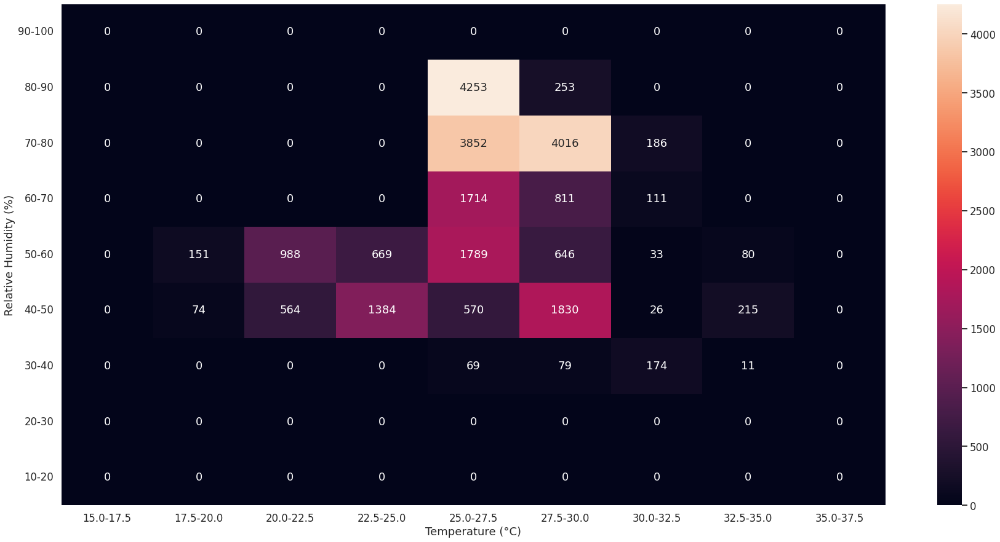

In [63]:
plot = sns.heatmap(binned_data_sum, annot=True, fmt="g")
plot.set(xlabel="Temperature (°C)", ylabel="Relative Humidity (%)")
plot.set_yticklabels(binned_data_sum.index, rotation=0);

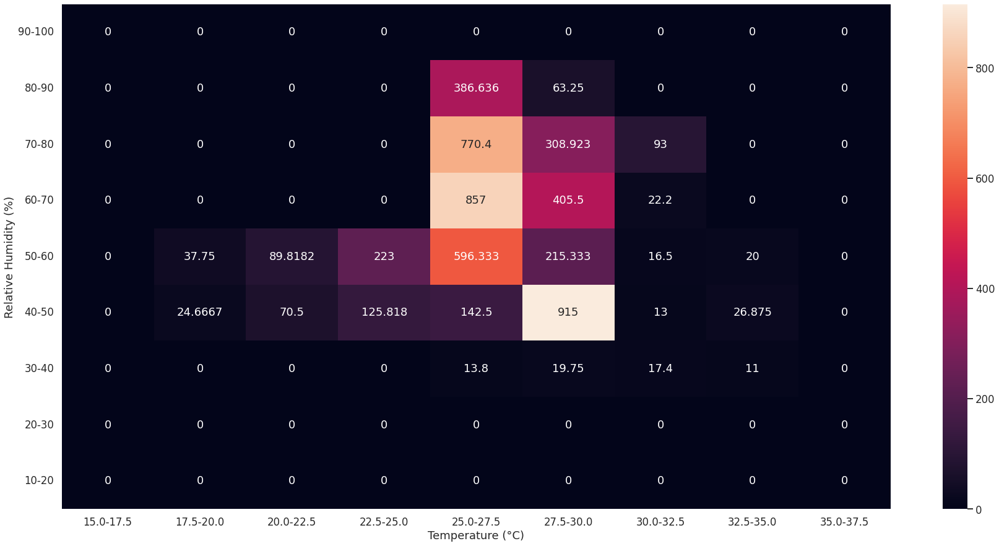

In [64]:
plot = sns.heatmap(binned_data, annot=True, fmt="g")
plot.set(xlabel="Temperature (°C)", ylabel="Relative Humidity (%)")
plot.set_yticklabels(binned_data.index, rotation=0);

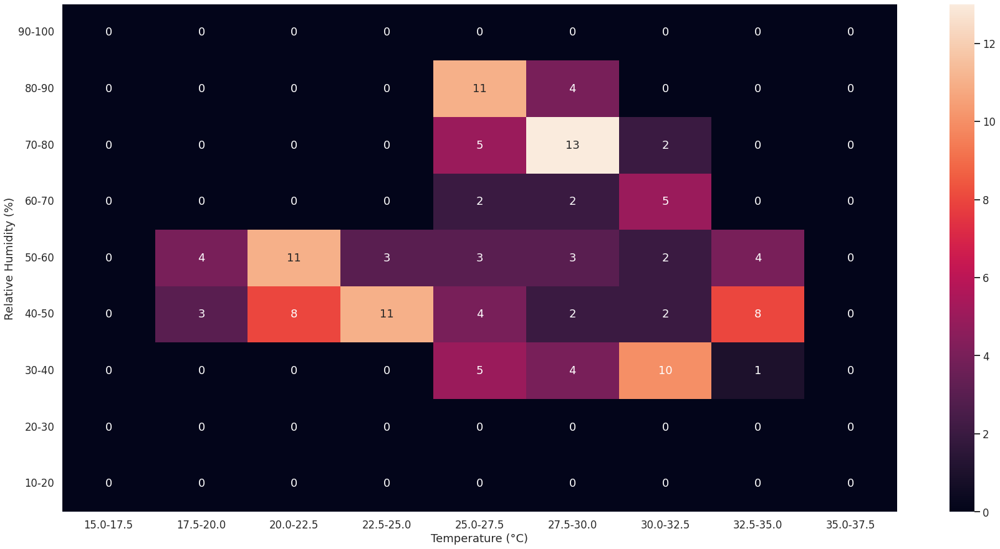

In [65]:
plot = sns.heatmap(binned_datapoint_count, annot=True, fmt="g")
plot.set(xlabel="Temperature (°C)", ylabel="Relative Humidity (%)")
plot.set_yticklabels(binned_datapoint_count.index, rotation=0);

In [66]:
data = pd.DataFrame(
    zip(monthly_data["Delta Temp"], monthly_data["Delta RH"], dengue_cases_data),
    columns=["Delta Temp", "Delta RH", "Dengue Cases"],
)
binned_data = []
binned_data_sum = []
binned_datapoint_count = []
for i in range(0, 8):
    for j in range(2, 8):
        query = f"`Delta Temp` >= {i*2.5} and `Delta Temp` < {(i+1)*2.5} and `Delta RH` >= {j*7.5} and `Delta RH` < {(j+1)*7.5}"
        result = data.query(query)["Dengue Cases"]
        binned_data.append(result.mean())
        binned_data_sum.append(result.sum())
        binned_datapoint_count.append(len(result))

temps = [f"{i*2.5}-{(i+1)*2.5}" for i in range(0, 8)]
binned_data = [0 if math.isnan(x) else x for x in binned_data]
binned_data = pd.DataFrame(
    np.vstack(np.split(np.array(binned_data), 8)),
    columns=[f"{x * 7.5}-{(x + 1)*7.5}" for x in range(2, 8)],
)
binned_data.index = temps
binned_data = binned_data.transpose()
binned_data = binned_data.iloc[::-1]
binned_data.to_csv(f"{data_dir}/DeltaTempvsDeltaRHCases.csv")
binned_data_sum = [0 if math.isnan(x) else x for x in binned_data_sum]
binned_data_sum = pd.DataFrame(
    np.vstack(np.split(np.array(binned_data_sum), 8)),
    columns=[f"{x * 7.5}-{(x + 1)*7.5}" for x in range(2, 8)],
)
binned_data_sum.index = temps
binned_data_sum = binned_data_sum.transpose()
binned_data_sum = binned_data_sum.iloc[::-1]
binned_data_sum.to_csv(f"{data_dir}/DeltaTempvsDeltaRHSumCases.csv")
binned_datapoint_count = pd.DataFrame(
    np.vstack(np.split(np.array(binned_datapoint_count), 8)),
    columns=[f"{x * 7.5}-{(x + 1)*7.5}" for x in range(2, 8)],
)
binned_datapoint_count.index = temps
binned_datapoint_count = binned_datapoint_count.transpose()
binned_datapoint_count = binned_datapoint_count.iloc[::-1]
binned_datapoint_count.to_csv(f"{data_dir}/DeltaTempvsDeltaRHCasesCount.csv")

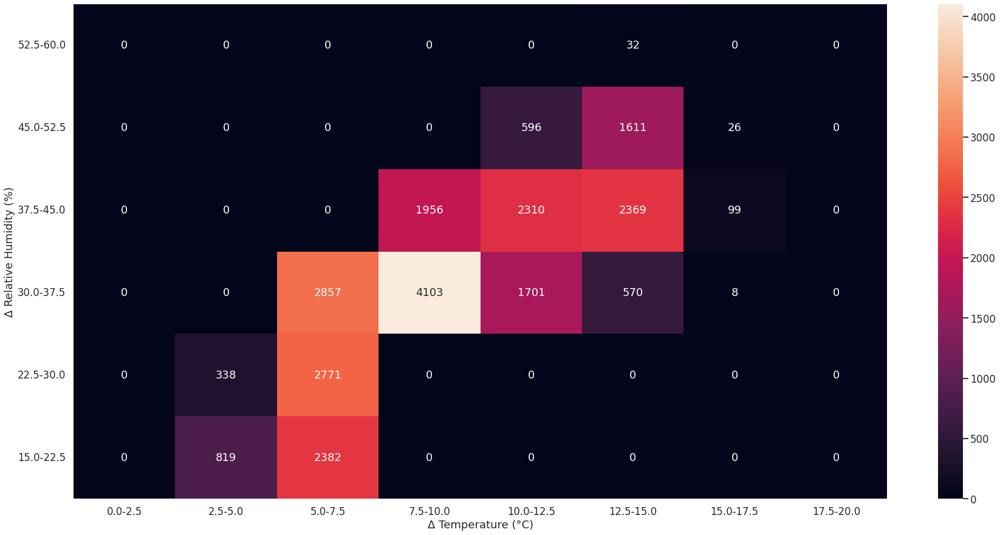

In [67]:
plot = sns.heatmap(binned_data_sum, annot=True, fmt="g")
plot.set(xlabel="Δ Temperature (°C)", ylabel="Δ Relative Humidity (%)")
plot.set_yticklabels(binned_data_sum.index, rotation=0);

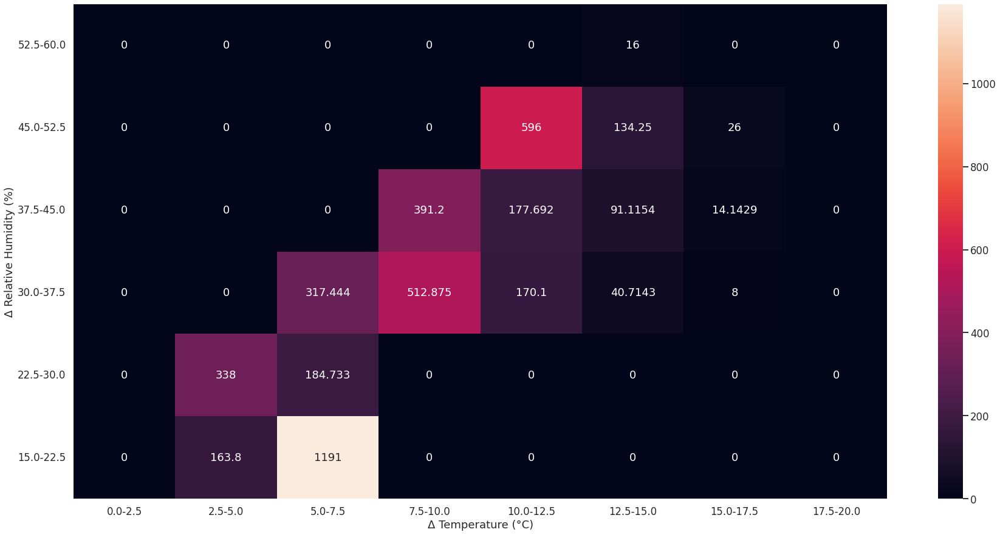

In [68]:
plot = sns.heatmap(binned_data, annot=True, fmt="g")
plot.set(xlabel="Δ Temperature (°C)", ylabel="Δ Relative Humidity (%)")
plot.set_yticklabels(binned_data.index, rotation=0);

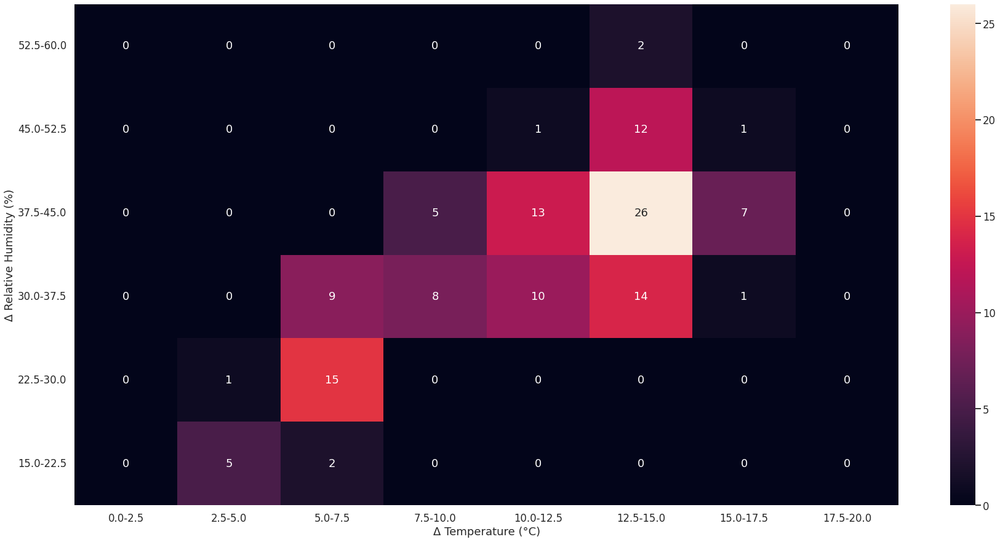

In [69]:
plot = sns.heatmap(binned_datapoint_count, annot=True, fmt="g")
plot.set(xlabel="Δ Temperature (°C)", ylabel="Δ Relative Humidity (%)")
plot.set_yticklabels(binned_datapoint_count.index, rotation=0);

In [70]:
data = pd.DataFrame(
    zip(monthly_data_lst["Delta Temp"], monthly_data["Delta RH"], dengue_cases_data),
    columns=["Delta Temp", "Delta RH", "Dengue Cases"],
)
binned_data = []
binned_data_sum = []
binned_datapoint_count = []
for i in range(1, 12):
    for j in range(2, 8):
        query = f"`Delta Temp` >= {i*2.5} and `Delta Temp` < {(i+1)*2.5} and `Delta RH` >= {j*7.5} and `Delta RH` < {(j+1)*7.5}"
        result = data.query(query)["Dengue Cases"]
        binned_data.append(result.mean())
        binned_data_sum.append(result.sum())
        binned_datapoint_count.append(len(result))

temps = [f"{i*2.5}-{(i+1)*2.5}" for i in range(1, 12)]
binned_data = [0 if math.isnan(x) else x for x in binned_data]
binned_data = pd.DataFrame(
    np.vstack(np.split(np.array(binned_data), 11)),
    columns=[f"{x * 7.5}-{(x + 1)*7.5}" for x in range(2, 8)],
)
binned_data.index = temps
binned_data = binned_data.transpose()
binned_data = binned_data.iloc[::-1]
binned_data.to_csv(f"{data_dir}/DeltaLSTempvsDeltaRHCases.csv")
binned_data_sum = [0 if math.isnan(x) else x for x in binned_data_sum]
binned_data_sum = pd.DataFrame(
    np.vstack(np.split(np.array(binned_data_sum), 11)),
    columns=[f"{x * 7.5}-{(x + 1)*7.5}" for x in range(2, 8)],
)
binned_data_sum.index = temps
binned_data_sum = binned_data_sum.transpose()
binned_data_sum = binned_data_sum.iloc[::-1]
binned_data_sum.to_csv(f"{data_dir}/DeltaLSTempvsDeltaRHSumCases.csv")
binned_datapoint_count = pd.DataFrame(
    np.vstack(np.split(np.array(binned_datapoint_count), 11)),
    columns=[f"{x * 7.5}-{(x + 1)*7.5}" for x in range(2, 8)],
)
binned_datapoint_count.index = temps
binned_datapoint_count = binned_datapoint_count.transpose()
binned_datapoint_count = binned_datapoint_count.iloc[::-1]
binned_datapoint_count.to_csv(f"{data_dir}/DeltaLSTempvsDeltaRHCasesCount.csv")

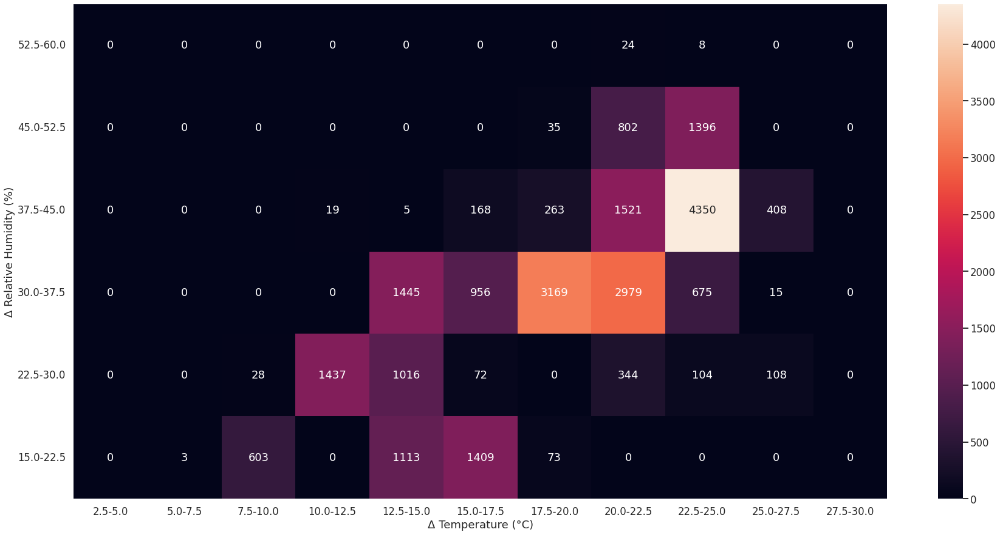

In [71]:
plot = sns.heatmap(binned_data_sum, annot=True, fmt="g")
plot.set(xlabel="Δ Temperature (°C)", ylabel="Δ Relative Humidity (%)")
plot.set_yticklabels(binned_data_sum.index, rotation=0);

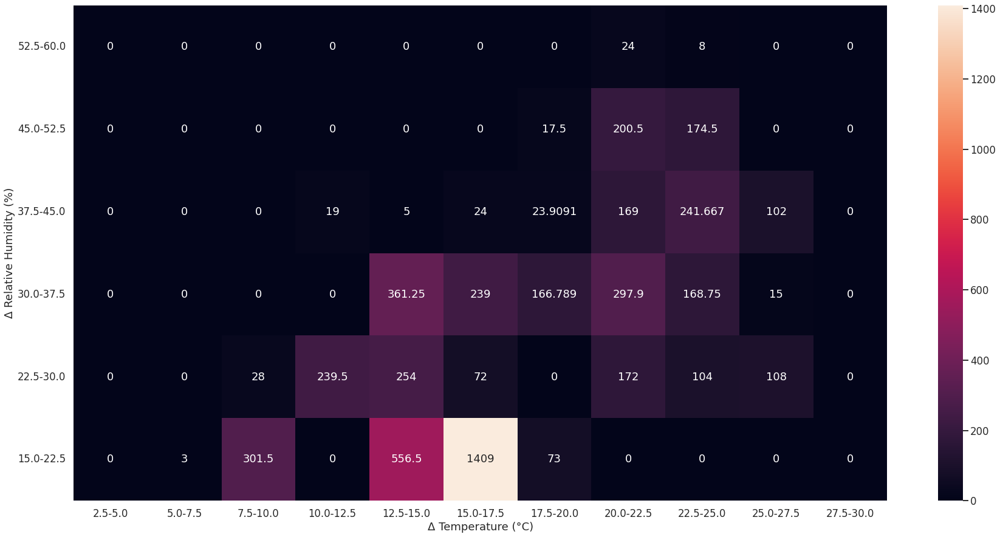

In [72]:
plot = sns.heatmap(binned_data, annot=True, fmt="g")
plot.set(xlabel="Δ Temperature (°C)", ylabel="Δ Relative Humidity (%)")
plot.set_yticklabels(binned_data.index, rotation=0);

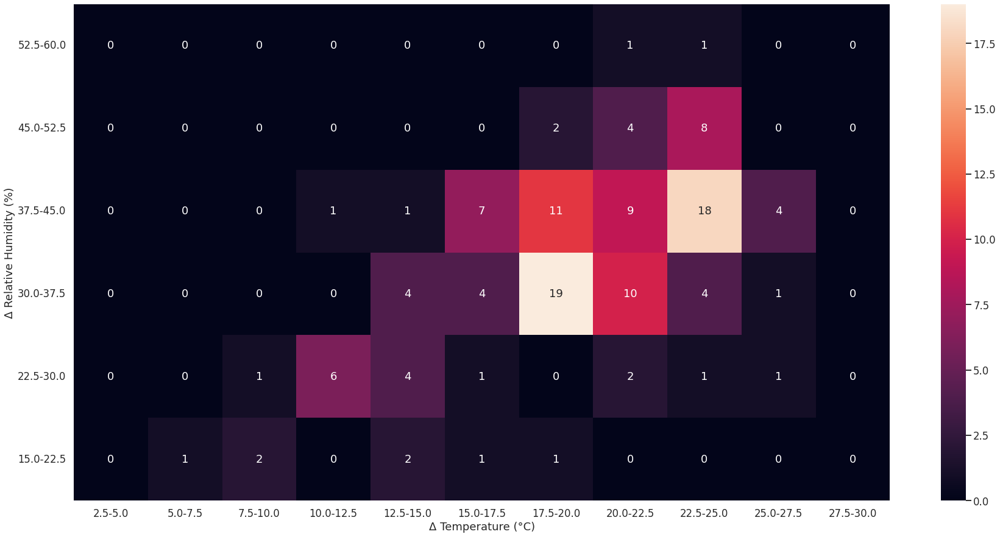

In [73]:
plot = sns.heatmap(binned_datapoint_count, annot=True, fmt="g")
plot.set(xlabel="Δ Temperature (°C)", ylabel="Δ Relative Humidity (%)")
plot.set_yticklabels(binned_datapoint_count.index, rotation=0);

In [74]:
%%capture
!jupyter nbconvert --to pdf "/content/drive/MyDrive/Ahmedabad University/Research Assistantship/Research Assistantship 3.ipynb"